# Encoders - Compare encoding capability

In [1]:
# Set Keras 3 backend to PyTorch and enable CUDA
import os
os.environ["KERAS_BACKEND"] = "torch"

import keras
keras.config.set_backend("torch")

import torch
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Keras backend:", keras.backend.backend())
print("PyTorch CUDA available:", torch.cuda.is_available())
print("Selected device:", device)

Keras backend: torch
PyTorch CUDA available: True
Selected device: cuda


In [2]:
import os, random, numpy as np

np.random.seed(13)
random.seed(13)
import sys, os
sys.path.append(os.path.abspath("../src"))

['date', 'maturity', 'tau', 'S0', 'K', 'rel_strike', 'q', 'r', 'market_iv', 'rf_0', 'rf_1', 'rf_2', 'rf_3', 'rf_4', 'rf_5', 'rf_6', 'rf_7', 'rf_8', 'rf_9', 'rf_10', 'rf_11', 'rf_12', 'rf_13', 'rf_14', 'rf_15', 'rf_16', 'rf_17', 'rf_18', 'rf_19', 'rf_20', 'rf_21', 'rf_22', 'rf_23', 'rf_24', 'rf_25', 'rf_26', 'rf_27', 'rf_28', 'rf_29', 'rf_30', 'rf_31', 'ssvi_theta', 'ssvi_rho', 'ssvi_beta', 'heston_kappa', 'heston_theta', 'heston_sigma', 'heston_rho', 'heston_v0']
(141790, 49)


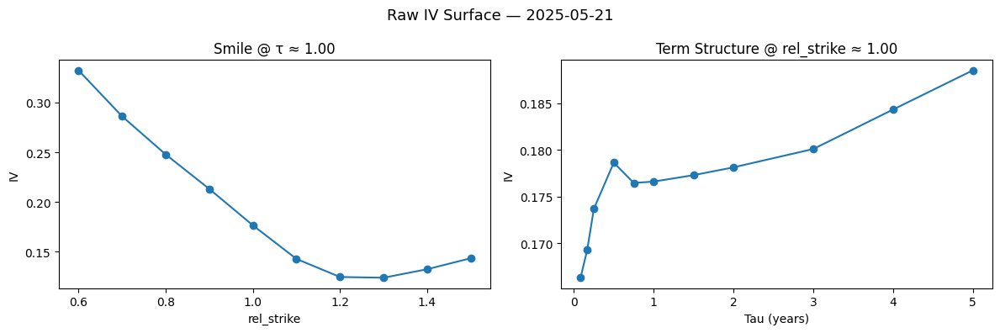

In [3]:

from data.loader import load_and_clean_raw_dataset

df = load_and_clean_raw_dataset("../data/vol_tensor_dataset.csv")

print(df.columns.tolist())
print(df.shape)
# === Global Variables ===
global LOOKBACK, BATCH_SIZE, LATENT_DIM, SURFACE_SHAPE, FEATURE_DIM
global TARGET_DATE, TARGET_STRIKE, TARGET_TAU

LOOKBACK = 20
BATCH_SIZE = 32
LATENT_DIM = 12
SURFACE_SHAPE = (11, 10)
FEATURE_DIM = LOOKBACK * (11 * 10 + 1 + 32)  

TARGET_DATE = "2025-05-21"
TARGET_STRIKE = 1.0
TARGET_TAU = 1.0

USE_PREPROCESSED_INPUTS = False

from utils.plotting import plot_raw_iv_slice

plot_raw_iv_slice(df, target_date=TARGET_DATE, target_strike=TARGET_STRIKE, target_tau=TARGET_TAU,)



## Create dataset with split features and surface 

In [4]:
from data.dataset_builder import build_full_surface_feature_df

df_all = build_full_surface_feature_df("../data/vol_tensor_dataset.csv")



print(" Final DataFrame shape:", df_all.shape)
print(" First 5 dates:", df_all.index[:5].tolist())

iv_cols = [c for c in df_all.columns if c.startswith("IV_")]
feat_cols = [c for c in df_all.columns if not c.startswith("IV_")]
df_all = df_all.dropna(subset=feat_cols)

print(" Surface cols:", len(iv_cols), "|  Feature cols:", len(feat_cols))
print("Surface columns (sample):", iv_cols[:5])
print("Feature columns (sample):", feat_cols[:5])

nan_summary = df_all[feat_cols].isna().sum()
nan_summary = nan_summary[nan_summary > 0].sort_values(ascending=False)
print("Features with NaNs:\n", nan_summary)




 Final DataFrame shape: (1289, 136)
 First 5 dates: [Timestamp('2020-03-09 00:00:00'), Timestamp('2020-03-11 00:00:00'), Timestamp('2020-03-12 00:00:00'), Timestamp('2020-03-13 00:00:00'), Timestamp('2020-03-16 00:00:00')]
 Surface cols: 110 |  Feature cols: 26
Surface columns (sample): ['IV_1m_0.60', 'IV_1m_0.70', 'IV_1m_0.80', 'IV_1m_0.90', 'IV_1m_1.00']
Feature columns (sample): ['log_return', 'log_return_ma20', 'log_return_z20', 'realized_vol_5d', 'realized_vol_5d_ma20']
Features with NaNs:
 Series([], dtype: int64)


edav the dataset 

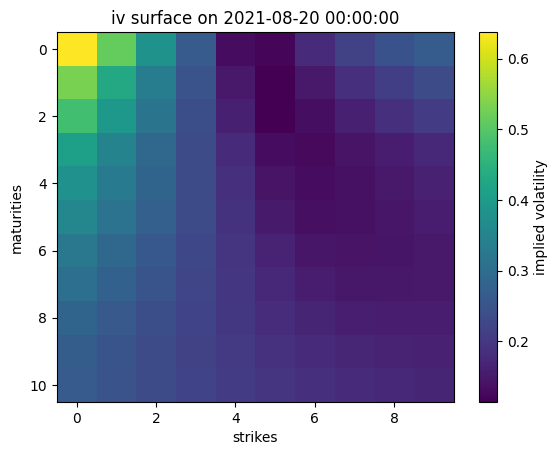


iv surface table on 2021-08-20 00:00:00


strike,0.6,0.7,0.8,0.9,1.0,1.1,1.2,1.3,1.4,1.5
maturity,,,,,,,,,,
18m,0.6376,0.5133,0.3838,0.2646,0.1324,0.1212,0.1786,0.2184,0.2459,0.2661
1m,0.5325,0.4293,0.3344,0.2475,0.1495,0.1147,0.1501,0.1851,0.2127,0.2338
1y,0.4786,0.3935,0.3153,0.2411,0.1601,0.1167,0.1347,0.1615,0.1863,0.2070
2m,0.4097,0.3476,0.2914,0.2358,0.1763,0.1322,0.1286,0.1413,0.1570,0.1729
2y,0.3799,0.3293,0.2828,0.2359,0.1855,0.1433,0.1323,0.1387,0.1498,0.1619
3m,0.3563,0.3141,0.2745,0.2341,0.1908,0.1520,0.1367,0.1385,0.1464,0.1561
3y,0.3249,0.2915,0.2597,0.2276,0.1947,0.1646,0.1467,0.1418,0.1442,0.1496
4y,0.3062,0.2774,0.2501,0.2234,0.1968,0.1725,0.1554,0.1479,0.1477,0.1507
5y,0.2830,0.2605,0.2394,0.2192,0.1998,0.1821,0.1683,0.1592,0.1551,0.1547


In [5]:
import matplotlib.pyplot as plt
import re
import numpy as np
import pandas as pd

# select random date
ix = np.random.randint(len(df_all))
date = df_all.index[ix]

# parse shape from iv column names
maturities = sorted(set(re.search(r"IV_(.*?)_", c).group(1) for c in iv_cols))
strikes = sorted(set(float(re.search(r"_(\d\.\d+)", c).group(1)) for c in iv_cols))

# extract and reshape surface
surface_values = df_all.iloc[ix][iv_cols].values.reshape(len(maturities), len(strikes))

# plot
plt.imshow(surface_values, cmap="viridis", aspect="auto")
plt.title(f"iv surface on {date}")
plt.xlabel("strikes")
plt.ylabel("maturities")
plt.colorbar(label="implied volatility")
plt.show()

# display surface table
surface_df = pd.DataFrame(surface_values, index=maturities, columns=strikes)
surface_df.index.name = "maturity"
surface_df.columns.name = "strike"

print(f"\niv surface table on {date}")
display(surface_df.round(4))

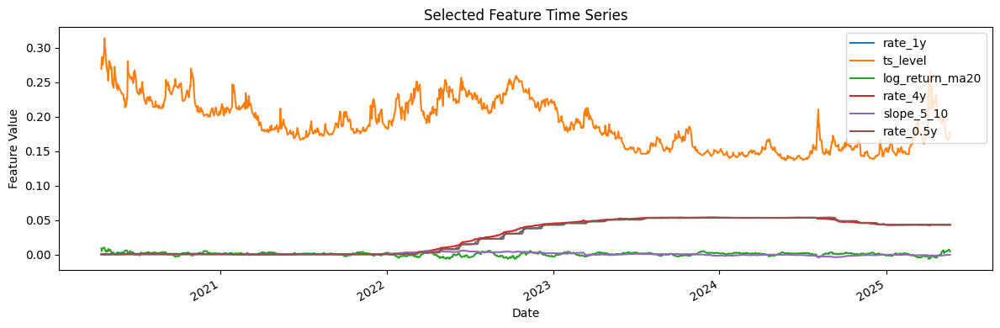

In [6]:

# plot 3 random features over time
selected_feats = np.random.choice(feat_cols, size=6, replace=False)

# Plot them over time
df_all[selected_feats].plot(figsize=(12, 4))
plt.title("Selected Feature Time Series")
plt.xlabel("Date")
plt.ylabel("Feature Value")
plt.legend(loc="best")
plt.tight_layout()
plt.show()



Generate tensors for the dataset 

In [7]:
from data.tensor_builder import prepare_surface_and_feature_tensors
from keras import ops

# === Below build_vol_tensors and interpolation functions ===
tensors, X_feat_tensor, df_feat = prepare_surface_and_feature_tensors(
    df_all=df_all,
    df_raw=df,
    feat_cols=feat_cols,
    monthly_interpolation=False  # or True
)



# Output summary
print("Structured tensors loaded and interpolated")
print("surface_tensor shape:", ops.shape(tensors["surface_tensor"]))
print("X_feat_tensor shape:", ops.shape(X_feat_tensor))
print("Number of taus:", len(tensors["taus"]))
print("Feature columns:", df_feat.columns.tolist())
print("Added IV_diff_mean/std → Final feature tensor shape:", ops.shape(X_feat_tensor))




Structured tensors loaded and interpolated
surface_tensor shape: (1258, 11, 10, 6)
X_feat_tensor shape: (1258, 136)
Number of taus: 11
Feature columns: ['log_return', 'log_return_ma20', 'log_return_z20', 'realized_vol_5d', 'realized_vol_5d_ma20', 'realized_vol_5d_z20', 'rate_0.25y', 'rate_0.5y', 'rate_1y', 'rate_2y', 'rate_3y', 'rate_4y', 'rate_5y', 'rate_10y', 'rate_30y', 'slope_5_10', 'slope_10_30', 'smile_skew', 'smile_convexity', 'ts_level', 'ts_slope', 'ts_curvature', 'ts_weighted', 'ts_short_avg', 'ts_long_avg', 'ts_split_slope']
Added IV_diff_mean/std → Final feature tensor shape: (1258, 136)


Adapt the PCA VAR analysis to tensors 

using 1258 valid samples out of 1258
surface nans: 0 / 138380
features nans: 0 / 171088
combined nans: 0 / 309468
valid rows: 1258 / 1258
pca reconstruction rmse (surface only): 0.0031


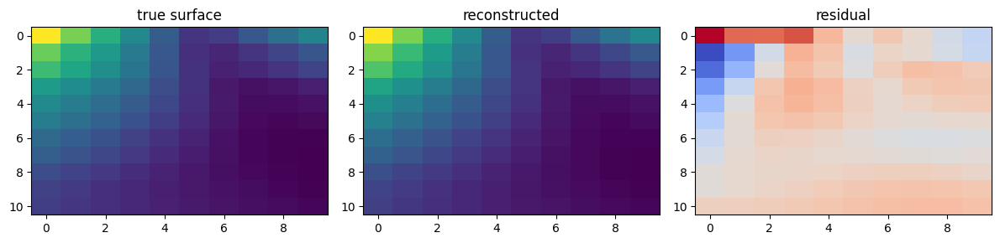

In [8]:
from models.encoder_pca import PCAEncoder
from sklearn.metrics import mean_squared_error
from keras import ops
import numpy as np
import matplotlib.pyplot as plt

# extract tensors to numpy
surface_np = ops.convert_to_numpy(tensors["surface_tensor"])  # (T, M, K, C)
features_np = ops.convert_to_numpy(X_feat_tensor)             # (T, D)
dates_np = tensors["date_tensor"]                             # list of dates

T, M, K, C = surface_np.shape
X_surface = surface_np[..., -1].reshape(T, M * K).astype("float32")
X_features = features_np.astype("float32")

# build combined input
X_combined = np.hstack([X_surface, X_features])  # shape (T, 110 + D)

# find valid rows with no nans
valid_mask = np.all(np.isfinite(X_combined), axis=1)
X_surface_valid = X_surface[valid_mask]
X_combined_valid = X_combined[valid_mask]
dates_valid = np.array(dates_np)[valid_mask]

print(f"using {len(X_combined_valid)} valid samples out of {T}")
# diagnostics
print("surface nans:", np.isnan(X_surface).sum(), "/", X_surface.size)
print("features nans:", np.isnan(X_features).sum(), "/", X_features.size)
print("combined nans:", np.isnan(X_combined).sum(), "/", X_combined.size)
print("valid rows:", valid_mask.sum(), "/", len(valid_mask))

# fit pca
pca = PCAEncoder(n_components=LATENT_DIM)
Z = pca.fit_transform(X_combined_valid)
X_recon = pca.inverse_transform(Z)

# evaluate surface rmse only
X_recon_surface = X_recon[:, :M*K]
rmse_surface = np.sqrt(mean_squared_error(X_surface_valid, X_recon_surface))
print(f"pca reconstruction rmse (surface only): {rmse_surface:.4f}")

# plot example surface
ix = 0  # pick first valid row
X_true = X_surface_valid[ix].reshape(M, K)
X_pred = X_recon_surface[ix].reshape(M, K)
residual = X_true - X_pred

fig, axs = plt.subplots(1, 3, figsize=(12, 3))
axs[0].imshow(X_true, cmap="viridis", aspect="auto")
axs[0].set_title("true surface")

axs[1].imshow(X_pred, cmap="viridis", aspect="auto")
axs[1].set_title("reconstructed")

axs[2].imshow(residual, cmap="coolwarm", aspect="auto")
axs[2].set_title("residual")

plt.tight_layout()
plt.show()

Surface reconstruction RMSE: 0.0031


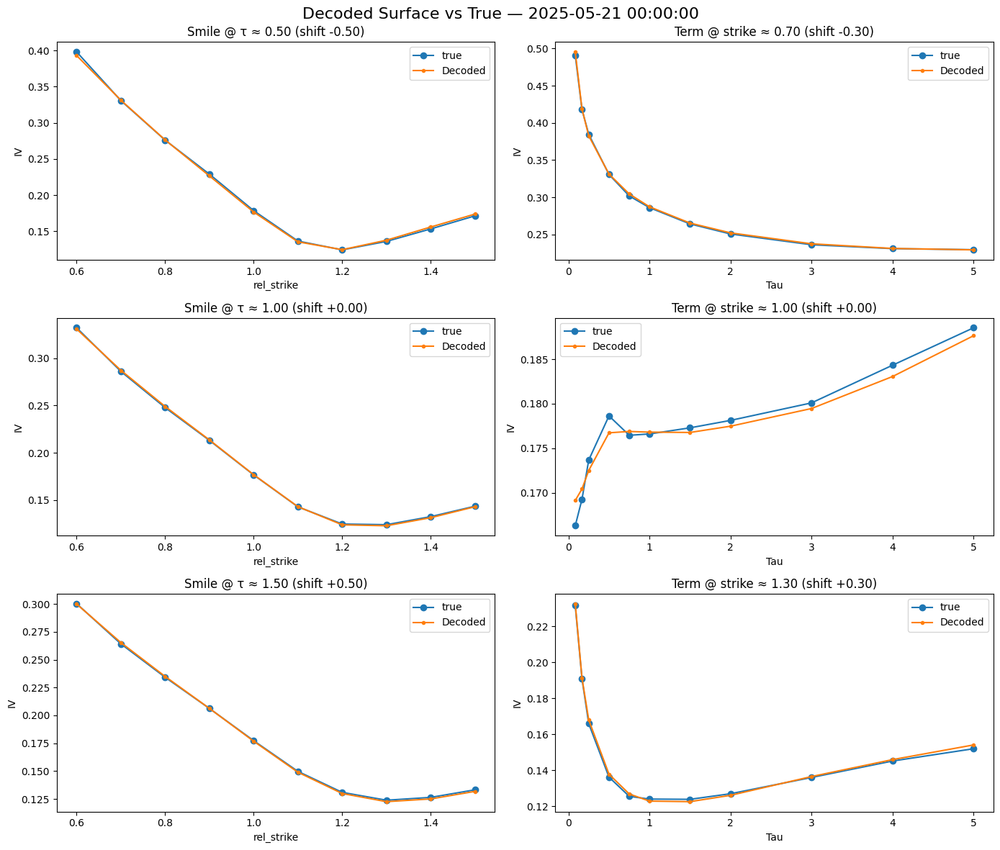

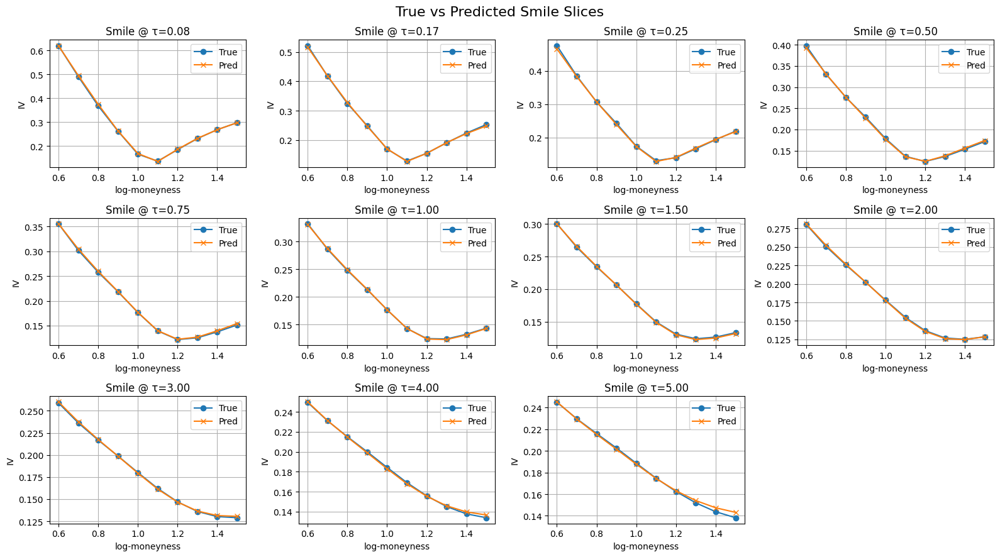

In [9]:
from utils.eval import evaluate_encoder
from utils.plotting import plot_iv_slices_shifts, plot_smile_slices_comparison

# Evaluate PCA
rmse_pca, X_recon_surf_pca, X_true_surf_pca, Z_pca, valid_mask = evaluate_encoder(
    encoder=pca,
    X_surface=X_surface,
    X_features=X_features,
    M=M, K=K,
    return_latent=True
)


# Visualize last reconstructed surface
true_surface_t_pca = X_true_surf_pca[-1]
recon_surface_t_pca = X_recon_surf_pca[-1]

plot_iv_slices_shifts(
    true_surface=true_surface_t_pca,
    decoded_surface=recon_surface_t_pca,
    taus=tensors["taus"],
    rel_strikes=tensors["rel_strikes"],
    decoded_date=tensors["date_tensor"][-1],
    target_tau=TARGET_TAU,
    target_strike=TARGET_STRIKE
)

plot_smile_slices_comparison(
    true_surface=true_surface_t_pca,
    pred_surface=recon_surface_t_pca,
    rel_strikes=tensors["rel_strikes"],
    taus=tensors["taus"]
)


Introduce custom dtaset using pytorch to be bale to perform batch analysis if needed and compare the results 

In [10]:
import importlib
import data.dataset
importlib.reload(data.dataset)

from data.tensor_builder import split_time_series_indices, slice_tensors
from data.dataset import FeatureToSurfaceDataset
from keras import ops
import pandas as pd
import numpy as np

# split time indices
T = tensors["surface_tensor"].shape[0]
train_idx, val_idx, test_idx = split_time_series_indices(T)

train = slice_tensors(tensors, train_idx)
val   = slice_tensors(tensors, val_idx)
test  = slice_tensors(tensors, test_idx)

BATCH_SIZE = 32

# create datasets with global index tracking
train_dataset = FeatureToSurfaceDataset(
    surface_tensor=train["surface_tensor"],
    feature_tensor=X_feat_tensor[train_idx],
    date_tensor=train["date_tensor"],
    batch_size=BATCH_SIZE,
    global_indices=train_idx
)

val_dataset = FeatureToSurfaceDataset(
    surface_tensor=val["surface_tensor"],
    feature_tensor=X_feat_tensor[val_idx],
    date_tensor=val["date_tensor"],
    batch_size=BATCH_SIZE,
    global_indices=val_idx
)

test_dataset = FeatureToSurfaceDataset(
    surface_tensor=test["surface_tensor"],
    feature_tensor=X_feat_tensor[test_idx],
    date_tensor=test["date_tensor"],
    batch_size=BATCH_SIZE,
    global_indices=test_idx
)

# diagnostics
FEATURE_DIM = train_dataset[0][0].shape[1]
M, K = tensors["surface_tensor"].shape[1:3]
flat_len = M * K

print(f"\ndataset shapes and diagnostics:")
print(f"  train_dataset batches: {len(train_dataset)}")
print(f"  val_dataset batches: {len(val_dataset)}")
print(f"  test_dataset batches: {len(test_dataset)}")
print(f"  each input shape: {train_dataset[0][0].shape}")
print(f"  iv surface dim (m, k): ({M}, {K})")

print(f"\nfeature breakdown:")
print(f"  iv surface (target): {flat_len}")
print(f"  feature input dim: {FEATURE_DIM}")

sample = ops.convert_to_numpy(train_dataset[0][0][0])
print(f"\nflat sample shape: {sample.shape}")

# check target date location
target_date = pd.Timestamp("2025-05-21")
idx = np.where(tensors["date_tensor"] == target_date)[0][0]
print("target global index:", idx)
print("in test?", idx in test_dataset.global_indices)
print("train:", train_idx[[0, -1]])
print("val:", val_idx[[0, -1]])
print("test:", test_idx[[0, -1]])


dataset shapes and diagnostics:
  train_dataset batches: 28
  val_dataset batches: 6
  test_dataset batches: 6
  each input shape: torch.Size([32, 246])
  iv surface dim (m, k): (11, 10)

feature breakdown:
  iv surface (target): 110
  feature input dim: 246

flat sample shape: (246,)
target global index: 1257
in test? True
train: [  0 879]
val: [ 880 1068]
test: [1069 1257]


In [11]:
import importlib
import models.ae
importlib.reload(models.ae)

from keras.optimizers import Adam
from keras.callbacks import ModelCheckpoint, ReduceLROnPlateau, EarlyStopping
from models.ae import AE
import os

# config
LATENT_DIM = 12
USE_DATASET = True
BATCH_SIZE = 32
EPOCHS = 300

# create output directory
os.makedirs("saved_models/ae", exist_ok=True)

# prepare training/val tensors
if USE_DATASET:
    print("using featuretosurfacedataset → x = [surface, features]")
    X_train_combined = train_dataset.to_tensor()
    X_val_combined   = val_dataset.to_tensor()
else:
    print("using legacy x_combined with surface + features")
    X_train_combined = X_combined
    X_val_combined   = None  # use validation_split

# build ae (no surface_dim needed)
input_dim = X_train_combined.shape[1]
ae = AE(
    input_dim=input_dim,
    latent_dim=LATENT_DIM,
    optimizer=Adam(1e-4),
    l2_penalty=1e-4
)

# callbacks
callbacks = [
    ModelCheckpoint("saved_models/ae/ae.weights.h5", monitor="val_loss", save_best_only=True, save_weights_only=True),
    ReduceLROnPlateau(monitor="val_loss", factor=0.5, patience=5),
    EarlyStopping(monitor="val_loss", patience=10, restore_best_weights=True)
]

# train
if USE_DATASET:
    history_ae = ae.fit(
        X_train_combined,
        X_train_combined,
        validation_data=(X_val_combined, X_val_combined),
        epochs=EPOCHS,
        batch_size=BATCH_SIZE,
        callbacks=callbacks,
        verbose=1
    )
else:
    history_ae = ae.fit(
        X_train_combined,
        X_train_combined,
        validation_split=0.2,
        epochs=EPOCHS,
        batch_size=BATCH_SIZE,
        callbacks=callbacks,
        verbose=1
    )

# save model + components
ae.save("saved_models/ae/ae_model.keras")
ae.encoder_net.save("saved_models/ae/ae_encoder.keras")
ae.decoder_net.save("saved_models/ae/ae_decoder.keras")

using featuretosurfacedataset → x = [surface, features]
Epoch 1/300
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.1902 - val_loss: 0.1667 - learning_rate: 1.0000e-04
Epoch 2/300
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.1633 - val_loss: 0.1464 - learning_rate: 1.0000e-04
Epoch 3/300
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.1432 - val_loss: 0.1365 - learning_rate: 1.0000e-04
Epoch 4/300
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.1329 - val_loss: 0.1276 - learning_rate: 1.0000e-04
Epoch 5/300
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.1247 - val_loss: 0.1191 - learning_rate: 1.0000e-04
Epoch 6/300
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.1160 - val_loss: 0.1103 - learning_rate: 1.0000e-04
Epoch 7/300
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.1069 - val_loss: 0.1010 - learning_rate: 1.0000e-04
Epoch 8/300
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0981 - val_loss: 0.0927 - learning_rate: 1.0000e-04
Epoch 9/300
28/28 ━━━━━━━━━━━━━━

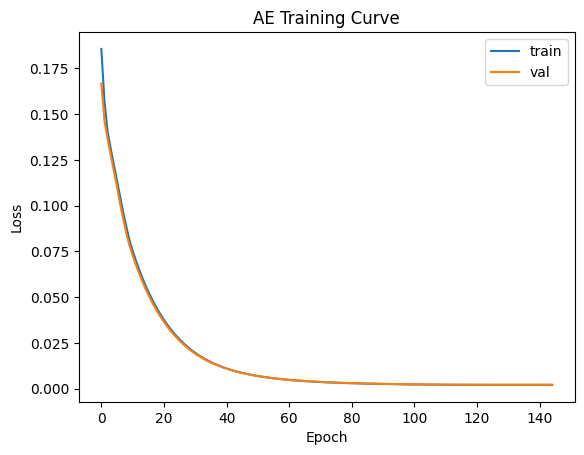

In [12]:
plt.plot(history_ae.history["loss"], label="train")
plt.plot(history_ae.history["val_loss"], label="val")
plt.title("AE Training Curve")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()
plt.show()


In [13]:
from utils.eval import evaluate_forecast, print_evaluation
from keras import ops

# extract evaluation input
if USE_DATASET:
   print("evaluating ae on featuretosurfacedataset...")
   X_test_combined = test_dataset.to_tensor()
else:
   print("evaluating ae on raw x_combined...")
   X_test_combined = X_combined

# evaluate reconstruction loss
test_loss = ae.evaluate(X_test_combined, X_test_combined, verbose=0)
recon_loss = float(test_loss)

print(f"\nae test loss:")
print(f"• reconstruction ≈ {recon_loss:.6f}")
print(" surface reconstructions are accurate." if recon_loss < 1e-3 else " reconstruction error > 0.001.")

# pointwise rmse/mae
X_decoded = ae.predict(X_test_combined, verbose=0)
X_true_np = ops.convert_to_numpy(X_test_combined)

mse, mae, _, _ = evaluate_forecast(X_true_np, X_decoded)
print_evaluation(mse, mae, label="ae combined input (surface + features)")

evaluating ae on featuretosurfacedataset...

ae test loss:
• reconstruction ≈ 0.002283
 reconstruction error > 0.001.
ae combined input (surface + features) MSE: 0.000345 | MAE: 0.011940


10/40 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0021

c:\Users\alessandro.esposito\source\repos\imperial\.venv\lib\site-packages\keras\src\saving\saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 42 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0021
Surface reconstruction RMSE: 0.0152


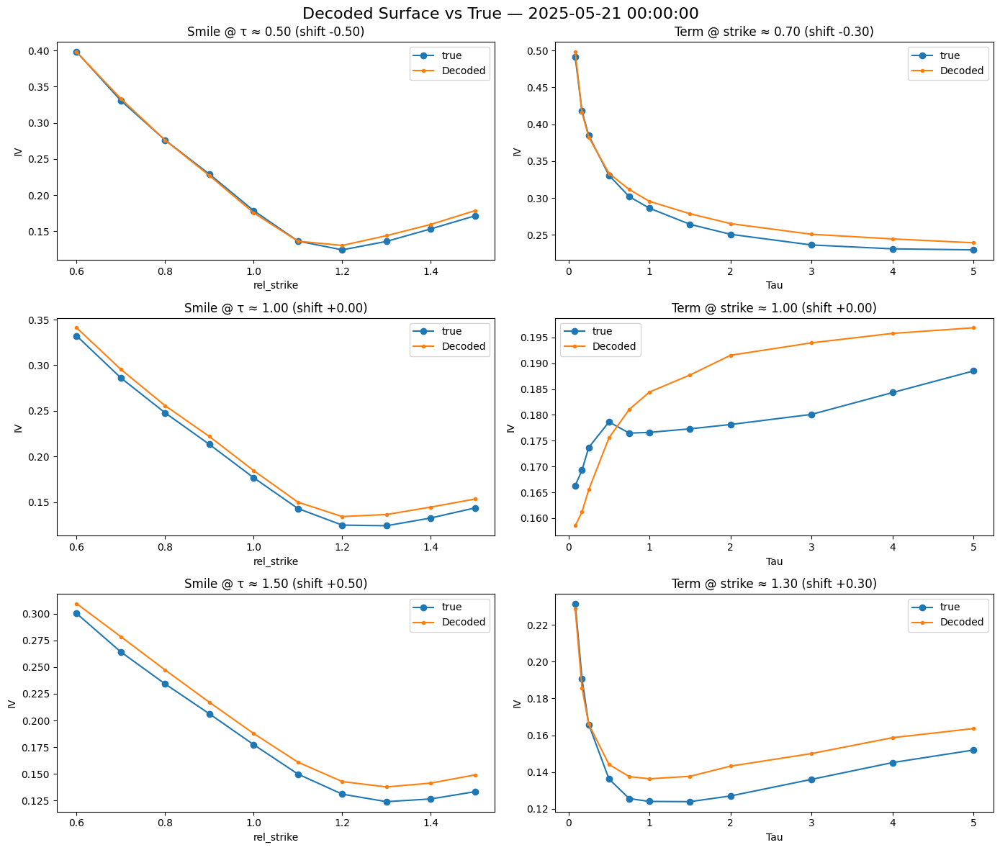

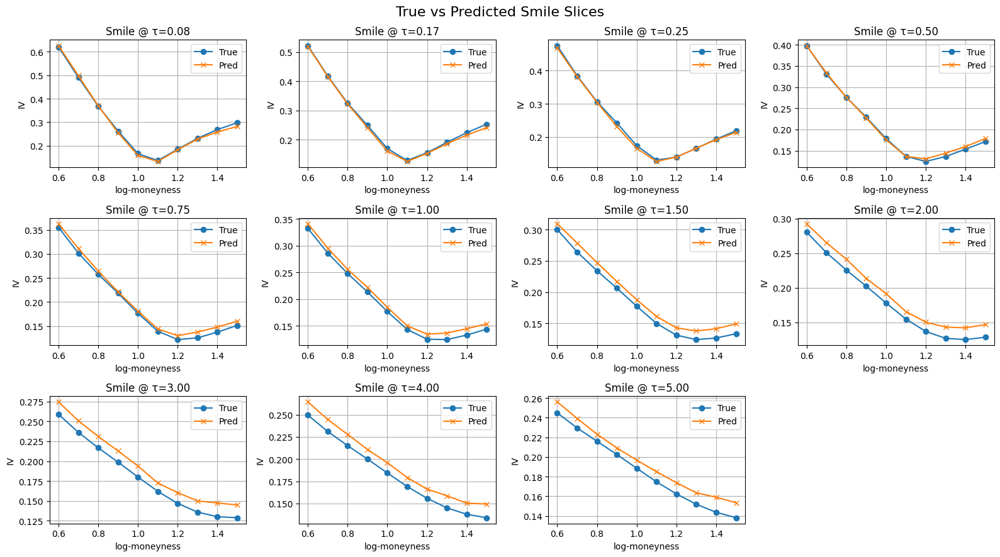

In [14]:
from models.ae import AE
from keras.optimizers import Adam
from keras import ops
import numpy as np
import pandas as pd
from data.dataset import FeatureToSurfaceDataset

# load full dataset tensor
if USE_DATASET:
   full_dataset = FeatureToSurfaceDataset(
       surface_tensor=tensors["surface_tensor"],
       feature_tensor=X_feat_tensor,
       date_tensor=tensors["date_tensor"],
       batch_size=None
   )
   X_combined_tensor = full_dataset.to_tensor()
else:
   X_combined_tensor = X_combined

input_dim = X_combined_tensor.shape[1]

# build ae model and load weights
ae = AE(input_dim=input_dim, latent_dim=LATENT_DIM, optimizer=Adam(1e-4))
ae(ops.convert_to_tensor(X_combined_tensor[:1]))  # build
ae.load_weights("saved_models/ae/ae.weights.h5")

# encode and decode
Z_ae = ops.convert_to_numpy(ae.encoder_net(X_combined_tensor))

flat_len = M * K
X_surface = ops.convert_to_numpy(X_combined_tensor[:, :flat_len])
X_features = ops.convert_to_numpy(X_combined_tensor[:, flat_len:])

rmse_ae, X_recon_surf_ae, X_true_surf_ae = evaluate_encoder(
   encoder=ae,
   X_surface=X_surface,
   X_features=X_features,
   M=M, K=K
)

# pick target date and get index
TARGET_DATE = pd.Timestamp("2025-05-21")
target_idx = np.where(tensors["date_tensor"] == TARGET_DATE)[0][0]
surface_idx = target_idx  # full tensor used so index matches

# visualize true vs decoded surface
true_surface_t_ae = X_true_surf_ae[surface_idx]
recon_surface_t_ae = X_recon_surf_ae[surface_idx]

plot_iv_slices_shifts(
   true_surface=true_surface_t_ae,
   decoded_surface=recon_surface_t_ae,
   taus=tensors["taus"],
   rel_strikes=tensors["rel_strikes"],
   decoded_date=TARGET_DATE,
   target_tau=TARGET_TAU,
   target_strike=TARGET_STRIKE
)

plot_smile_slices_comparison(
   true_surface=true_surface_t_ae,
   pred_surface=recon_surface_t_ae,
   rel_strikes=tensors["rel_strikes"],
   taus=tensors["taus"]
)

full dataset will be built from tensors


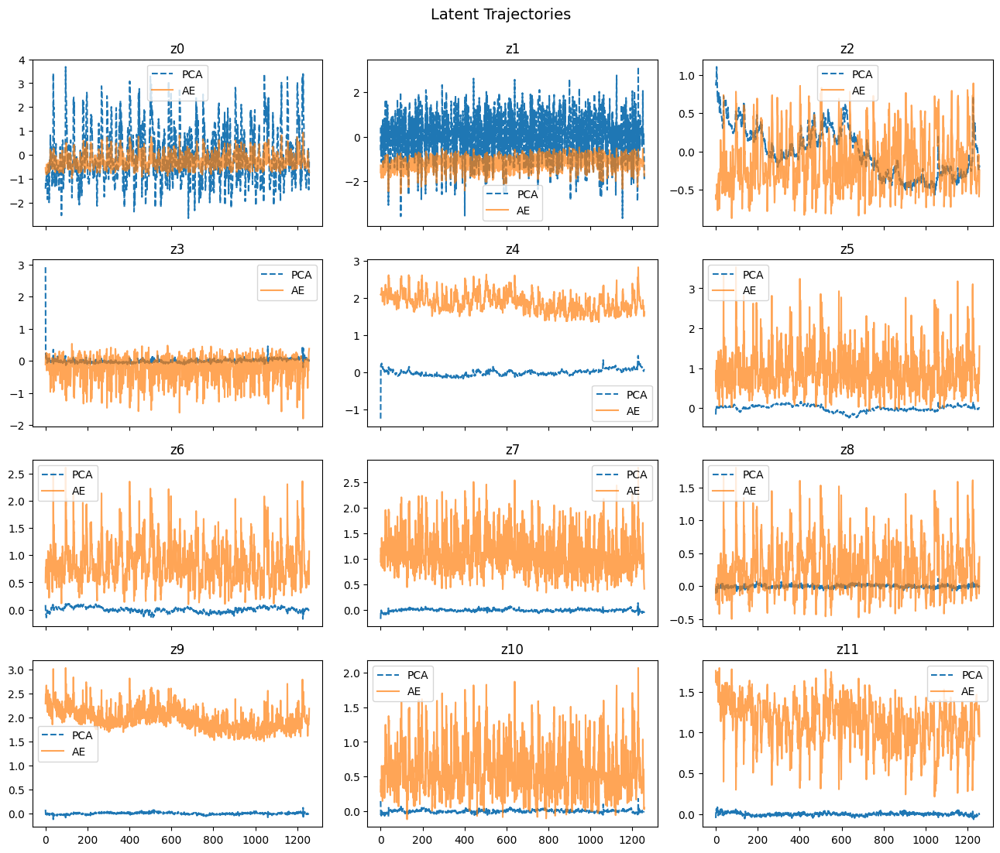

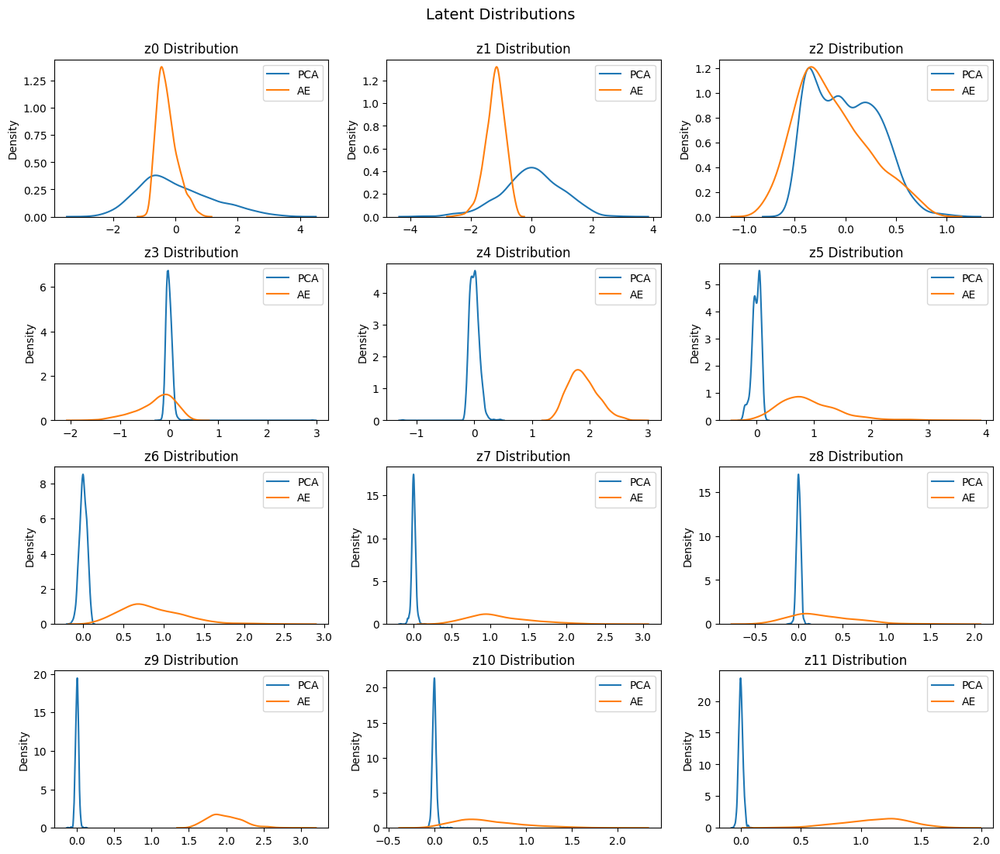

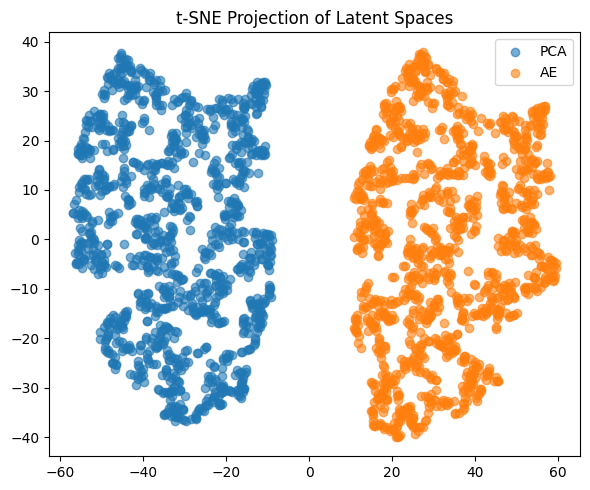

In [15]:
from utils.eval import compare_latent_spaces

if USE_DATASET:
   print("full dataset will be built from tensors")

   # build full dataset from tensors
   full_dataset = FeatureToSurfaceDataset(
       surface_tensor=tensors["surface_tensor"],
       feature_tensor=X_feat_tensor,
       date_tensor=tensors["date_tensor"]
   )

   # encode all available data
   Z_ae_full = ops.convert_to_numpy(ae.encoder_net(full_dataset.to_tensor()))

   # apply valid_mask to align with pca samples
   Z_ae_matched = Z_ae_full[valid_mask]

else:
   print("use df information to build z_ae_matched")
   Z_ae_matched = Z_ae[valid_mask]  # already built from x_combined

# plot comparisons
compare_latent_spaces(
   Z_a=Z_pca,
   Z_b=Z_ae_matched,
   valid_mask=None,
   labels=("PCA", "AE"),
   method="trajectory",
   full_analysis=True
)

compare_latent_spaces(
   Z_a=Z_pca,
   Z_b=Z_ae_matched,
   valid_mask=None,
   labels=("PCA", "AE"),
   method="tsne"
)

In [16]:
from scipy.spatial import procrustes

mtx1, mtx2, disparity = procrustes(Z_pca, Z_ae)  # shapes: (n_samples, latent_dim)
print("Procrustes MSE:", disparity)


Procrustes MSE: 0.018956193249260886


The very low Procrustes MSE indicates that the AE and PCA latent spaces are geometrically near-identical, differing only by a rigid transformation such as rotation or reflection. This suggests that the AE, while functioning correctly, has effectively learned to replicate the PCA structure rather than discovering a truly nonlinear manifold. This outcome is common when the data is predominantly linear, the AE model is shallow or under-regularized, or when the reconstruction loss dominates representation learning.


### Latent Trajectories: Smoothness vs. Variability

The latent trajectories show that PCA encodes signals with relatively high variability and clear temporal structure, particularly in dimensions like z0 and z1. In contrast, the AE latent space appears more compressed and noisier, with some dimensions (e.g. z3, z4) showing erratic fluctuations and limited temporal dynamics. This suggests that PCA preserves more interpretable, time-consistent variation, whereas the AE—despite using L2 regularization—might be overly constrained or failing to capture structured temporal information in its encoding.

### Latent Distributions: Compression vs. Spread

The KDE plots reveal that AE encodings are more peaked and symmetric, with many latent dimensions concentrated near the origin. PCA, on the other hand, maintains broader and often asymmetric distributions, indicating that it captures a wider range of variations across samples. The AE's narrow distributions could reflect underutilization of the latent space, suggesting that while regularization helped reduce overfitting, it may have led to collapse or redundancy in the representation. This behavior is especially visible in z5, where AE's output shows a single narrow mode while PCA spans a full range.

### t-SNE Embedding: Manifold Separation

The t-SNE plot clearly shows that PCA and AE embed the data into qualitatively different manifolds. Both methods produce separable, low-dimensional structures, but PCA covers a wider spatial extent while AE remains more localized. This may be attributed to AE’s nonlinearity and its L2 constraints pulling the representations inward. The spatial coherence within each cluster is promising, but the lack of overlap suggests that AE and PCA are not learning equivalent latent encodings, reinforcing that AE's space is less rich or orthogonal to that of PCA.


In [17]:
import importlib
import models.vae_l2
importlib.reload(models.vae_l2)

from keras.optimizers import Adam
from keras.callbacks import ModelCheckpoint, ReduceLROnPlateau, EarlyStopping
from models.vae_l2 import VAE, build_encoder, build_decoder, VAETrainingDebugCallback, KLEpochTracker
import os

# create output directory
os.makedirs("saved_models/vae_l2", exist_ok=True)

# config
USE_DATASET = True
vae_beta = 0.9
vae_latent_dim = LATENT_DIM
vae_l2_penalty = 5e-6
optimizer_l2 = Adam(1e-5)
EPOCHS = 100
BATCH_SIZE = 32

# training tensors
if USE_DATASET:
   print("using featuretosurfacedataset → x = [surface, features]")
   X_train = train_dataset.to_tensor()
   X_val   = val_dataset.to_tensor()
else:
   print("using legacy x_combined")
   X_train = X_combined
   X_val   = None  # use validation_split instead

# init vae
encoder_l2 = build_encoder(input_dim=X_train.shape[1], latent_dim=vae_latent_dim, l2_penalty=vae_l2_penalty)
decoder_l2 = build_decoder(output_dim=X_train.shape[1], latent_dim=vae_latent_dim, l2_penalty=vae_l2_penalty)
vae_l2 = VAE(encoder=encoder_l2, decoder=decoder_l2, beta=vae_beta, kl_warmup=True)
vae_l2.compile(optimizer=optimizer_l2)

# callbacks
debug_cb_l2 = VAETrainingDebugCallback(vae_model=vae_l2, X_val=X_val if X_val is not None else X_train)
callbacks = [
   KLEpochTracker(vae_l2),
   debug_cb_l2,
   ModelCheckpoint("saved_models/vae_l2/vae_l2.weights.h5", monitor="val_loss", save_best_only=True, save_weights_only=True),
   ReduceLROnPlateau(monitor="val_loss", factor=0.5, patience=5),
   EarlyStopping(monitor="val_loss", patience=10, restore_best_weights=False)
]

# train
if USE_DATASET:
   history_vae_l2 = vae_l2.fit(
       X_train,
       X_train,
       validation_data=(X_val, X_val),
       epochs=EPOCHS,
       batch_size=BATCH_SIZE,
       callbacks=callbacks,
       verbose=1
   )
else:
   history_vae_l2 = vae_l2.fit(
       X_train,
       X_train,
       validation_split=0.2,
       epochs=EPOCHS,
       batch_size=BATCH_SIZE,
       callbacks=callbacks,
       verbose=1
   )

# save components
vae_l2.save("saved_models/vae_l2/vae_l2_model.keras")
vae_l2.encoder.save("saved_models/vae_l2/vae_l2_encoder.keras")
vae_l2.decoder.save("saved_models/vae_l2/vae_l2_decoder.keras")

using featuretosurfacedataset → x = [surface, features]
Epoch 1/100
26/28 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - kl_loss: 0.0831 - loss: 0.1144 - reconstruction_loss: 0.1144 - z_logvar_mean: 0.0426 - z_mean_std: 0.3656[vae_mle_debug | epoch 001] recon mle: 0.235266 | z_std: 0.2861 | z_mean_abs: 0.2376 | z_logvar_mean: -0.0087
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - kl_loss: 0.0826 - loss: 0.1141 - reconstruction_loss: 0.1141 - z_logvar_mean: 0.0404 - z_mean_std: 0.3647 - val_kl_loss: 0.0508 - val_loss: 0.0936 - val_reconstruction_loss: 0.0936 - val_z_logvar_mean: -0.0090 - val_z_mean_std: 0.2860 - learning_rate: 1.0000e-05
Epoch 2/100
26/28 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - kl_loss: 0.0673 - loss: 0.1022 - reconstruction_loss: 0.1009 - z_logvar_mean: -0.0408 - z_mean_std: 0.3321[vae_mle_debug | epoch 002] recon mle: 0.223932 | z_std: 0.2601 | z_mean_abs: 0.2192 | z_logvar_mean: -0.0744
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - kl_loss: 0.0670 - loss: 0.1020 - reconstruction_loss: 0.10

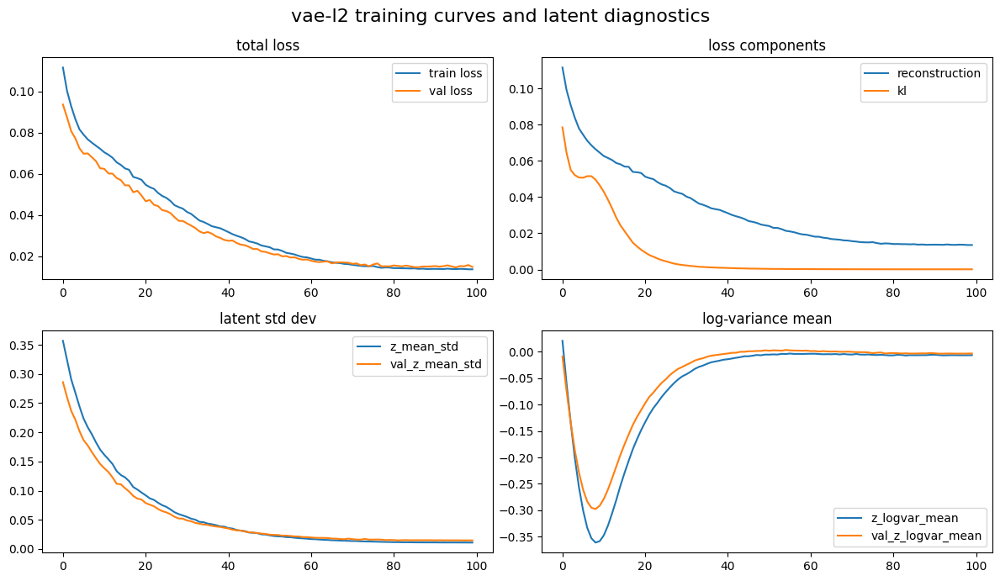

In [18]:
import matplotlib.pyplot as plt

fig, axs = plt.subplots(2, 2, figsize=(12, 7))
plt.suptitle("vae-l2 training curves and latent diagnostics", fontsize=16)

# top row: loss curves
axs[0, 0].plot(history_vae_l2.history["loss"], label="train loss")
axs[0, 0].plot(history_vae_l2.history.get("val_loss", []), label="val loss")
axs[0, 0].set_title("total loss")
axs[0, 0].legend()

axs[0, 1].plot(history_vae_l2.history.get("reconstruction_loss", []), label="reconstruction")
axs[0, 1].plot(history_vae_l2.history.get("kl_loss", []), label="kl")
axs[0, 1].set_title("loss components")
axs[0, 1].legend()

# bottom row: latent diagnostics
axs[1, 0].plot(history_vae_l2.history.get("z_mean_std", []), label="z_mean_std")
axs[1, 0].plot(history_vae_l2.history.get("val_z_mean_std", []), label="val_z_mean_std")
axs[1, 0].set_title("latent std dev")
axs[1, 0].legend()

axs[1, 1].plot(history_vae_l2.history.get("z_logvar_mean", []), label="z_logvar_mean")
axs[1, 1].plot(history_vae_l2.history.get("val_z_logvar_mean", []), label="val_z_logvar_mean")
axs[1, 1].set_title("log-variance mean")
axs[1, 1].legend()

plt.tight_layout()
plt.show()

### Variance collapsed aim to have std = 1 and loss 0 

In [19]:
from utils.eval import evaluate_forecast, print_evaluation
from keras import ops

# prepare evaluation input
if USE_DATASET:
   print("evaluating vae-l2 on featuretosurfacedataset")
   X_test_tensor = test_dataset.to_tensor()
else:
   print("evaluating vae-l2 on raw x_combined")
   X_test_tensor = X_combined

# evaluate model metrics
test_metrics_l2 = vae_l2.evaluate(X_test_tensor, X_test_tensor, verbose=0)
recon_loss_l2, kl_div_l2, z_mean_std_l2, *rest = [float(x) for x in test_metrics_l2]

print(f"\ntest loss breakdown (vae-l2):")
print(f"• reconstruction ≈ {recon_loss_l2:.6f} | kl ≈ {kl_div_l2:.6f} | z_std ≈ {z_mean_std_l2:.6f}")
print(" surface reconstructions are accurate." if recon_loss_l2 < 1e-3 else " reconstruction error higher than expected.")
print(" kl term is small - posterior close to prior." if kl_div_l2 < 1e-2 else " kl term is high - might overpower reconstruction.")
print(" latent space compressed but active." if 1e-3 < z_mean_std_l2 < 0.05 else " latent space underutilized or too dispersed.")

# pointwise decoding rmse/mae
X_decoded_l2 = vae_l2.predict(X_test_tensor, verbose=0)
X_true_np = ops.convert_to_numpy(X_test_tensor)

mse_l2, mae_l2, _, _ = evaluate_forecast(X_true_np, X_decoded_l2)
print_evaluation(mse_l2, mae_l2, label="vae-l2 surface (pointwise)")

evaluating vae-l2 on featuretosurfacedataset

test loss breakdown (vae-l2):
• reconstruction ≈ 0.014546 | kl ≈ 0.014295 | z_std ≈ 0.000278
 reconstruction error higher than expected.
 kl term is high - might overpower reconstruction.
 latent space underutilized or too dispersed.
vae-l2 surface (pointwise) MSE: 0.014423 | MAE: 0.056293


13/40 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - kl_loss: 0.0044 - loss: 0.0130 - reconstruction_loss: 0.0130 - z_logvar_mean: -0.0800 - z_mean_std: 0.0350  

c:\Users\alessandro.esposito\source\repos\imperial\.venv\lib\site-packages\keras\src\saving\saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 38 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


40/40 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - kl_loss: 0.0256 - loss: 0.0127 - reconstruction_loss: 0.0127 - z_logvar_mean: -0.2165 - z_mean_std: 0.0822
Surface reconstruction RMSE: 0.0710


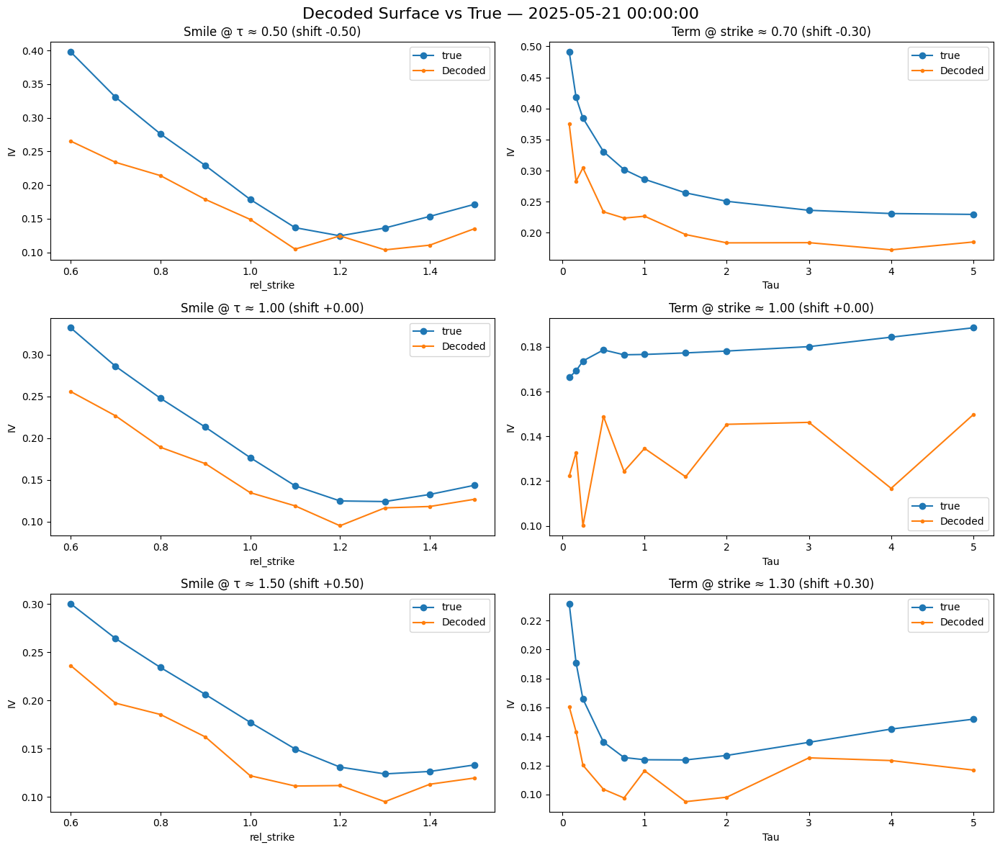

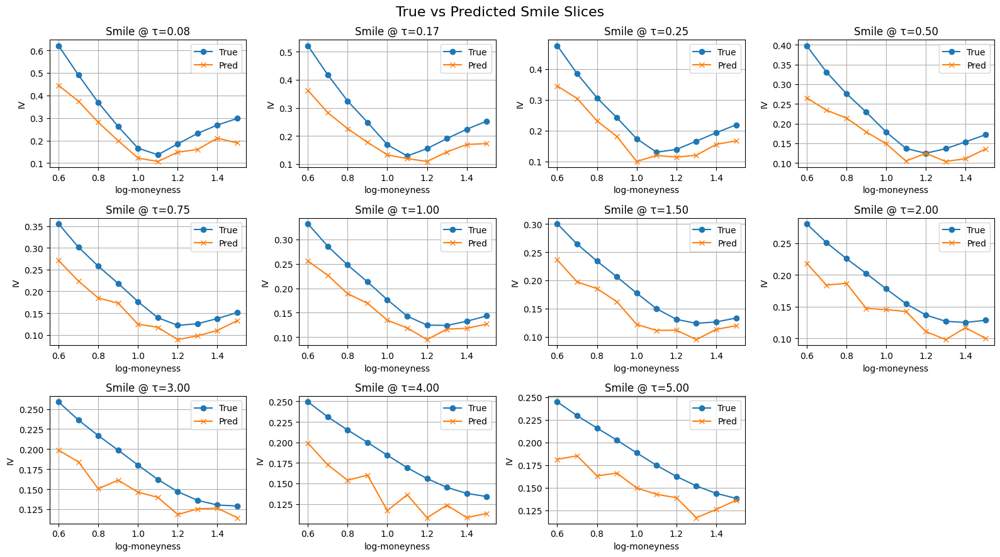

In [20]:
from models.vae_l2 import VAE, build_encoder, build_decoder
from keras.optimizers import Adam
from keras import ops
import pandas as pd
from data.dataset import FeatureToSurfaceDataset

# load full combined dataset
if USE_DATASET:
   full_dataset = FeatureToSurfaceDataset(
       surface_tensor=tensors["surface_tensor"],
       feature_tensor=X_feat_tensor,
       date_tensor=tensors["date_tensor"],
       batch_size=None
   )
   X_combined_tensor = full_dataset.to_tensor()
else:
   X_combined_tensor = X_combined

input_dim = X_combined_tensor.shape[1]

# rebuild and load model
encoder_l2 = build_encoder(input_dim=input_dim, latent_dim=vae_latent_dim, l2_penalty=vae_l2_penalty)
decoder_l2 = build_decoder(output_dim=input_dim, latent_dim=vae_latent_dim, l2_penalty=vae_l2_penalty)

vae_l2 = VAE(encoder=encoder_l2, decoder=decoder_l2, beta=vae_beta, kl_warmup=True)
vae_l2.compile(optimizer=Adam(1e-4))
vae_l2(ops.convert_to_tensor(X_combined_tensor[:1]))  # build
vae_l2.load_weights("saved_models/vae_l2/vae_l2.weights.h5")

# encode
_, z_mean_l2, _ = vae_l2.encoder(X_combined_tensor)
Z_vae_l2 = ops.convert_to_numpy(z_mean_l2)

# decode
flat_len = M * K
X_surface = ops.convert_to_numpy(X_combined_tensor[:, :flat_len])
X_features = ops.convert_to_numpy(X_combined_tensor[:, flat_len:])

rmse_vae_l2, X_recon_surf_vae_l2, X_true_surf_vae_l2 = evaluate_encoder(
   encoder=vae_l2,
   X_surface=X_surface,
   X_features=X_features,
   M=M, K=K
)

# pick target date
TARGET_DATE = pd.Timestamp("2025-05-21")
target_idx = np.where(tensors["date_tensor"] == TARGET_DATE)[0][0]
surface_idx = target_idx

# plot
true_surface_t_vae_l2 = X_true_surf_vae_l2[surface_idx]
recon_surface_t_vae_l2 = X_recon_surf_vae_l2[surface_idx]

plot_iv_slices_shifts(
   true_surface=true_surface_t_vae_l2,
   decoded_surface=recon_surface_t_vae_l2,
   taus=tensors["taus"],
   rel_strikes=tensors["rel_strikes"],
   decoded_date=TARGET_DATE,
   target_tau=TARGET_TAU,
   target_strike=TARGET_STRIKE
)

plot_smile_slices_comparison(
   true_surface=true_surface_t_vae_l2,
   pred_surface=recon_surface_t_vae_l2,
   rel_strikes=tensors["rel_strikes"],
   taus=tensors["taus"]
)


pca vs vae_l2 - trajectories and t-sne


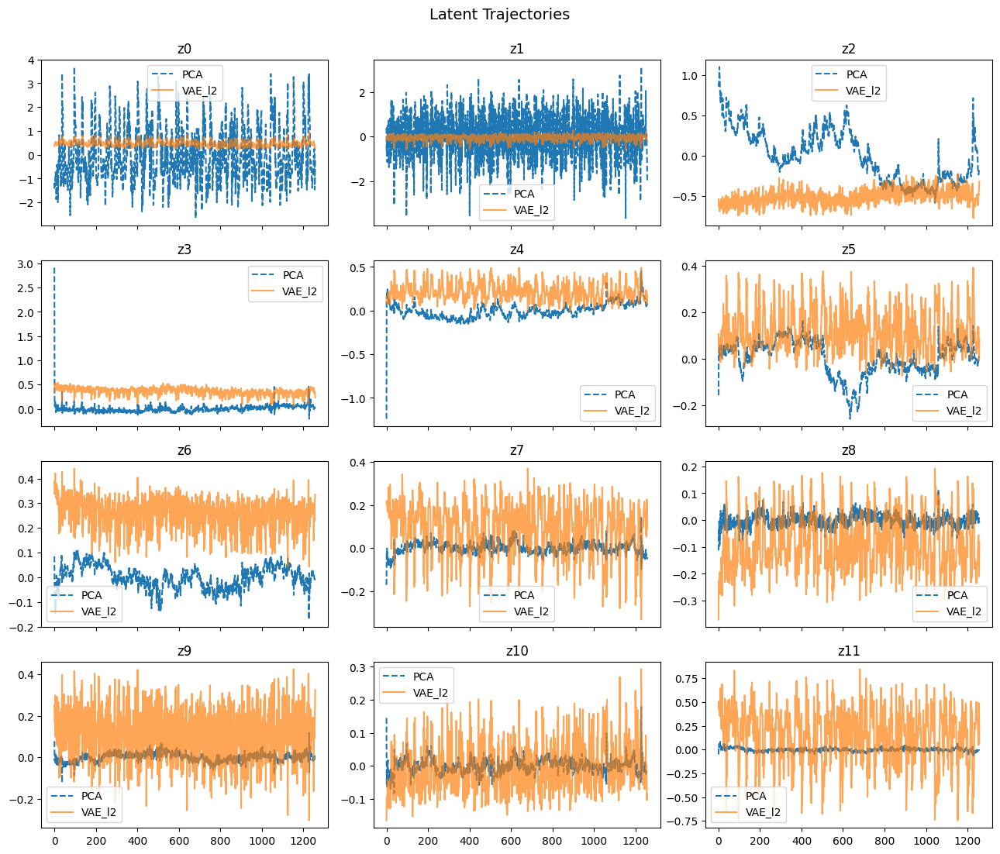

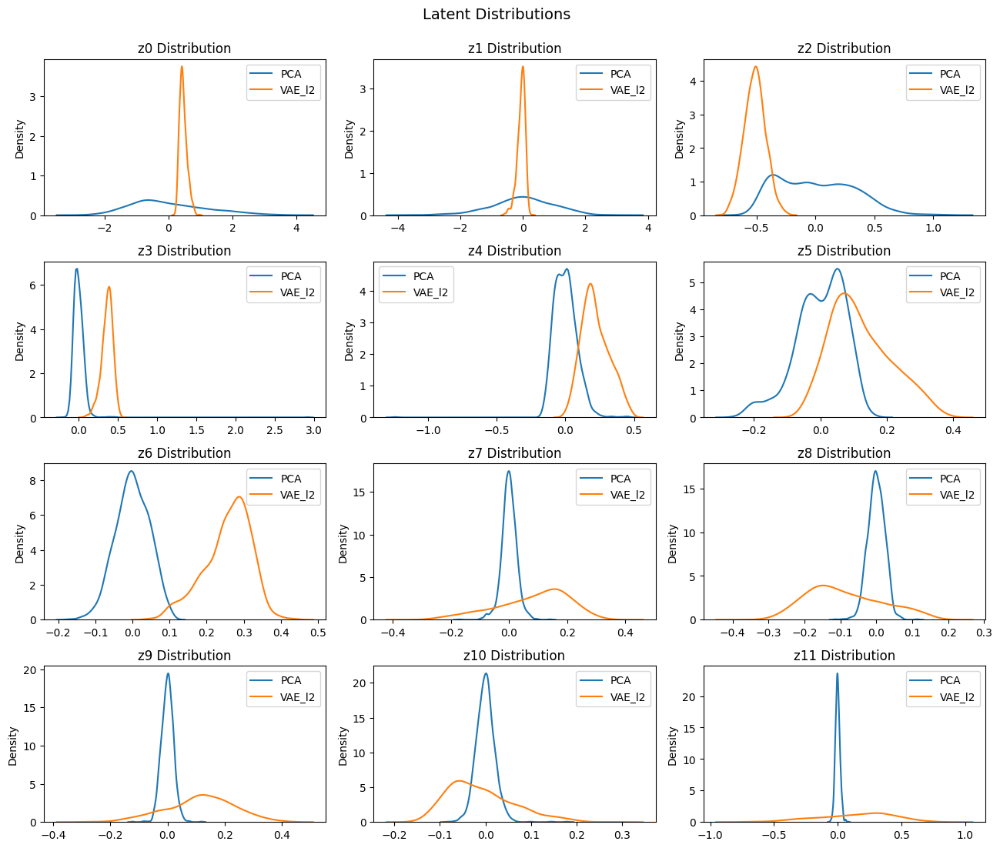

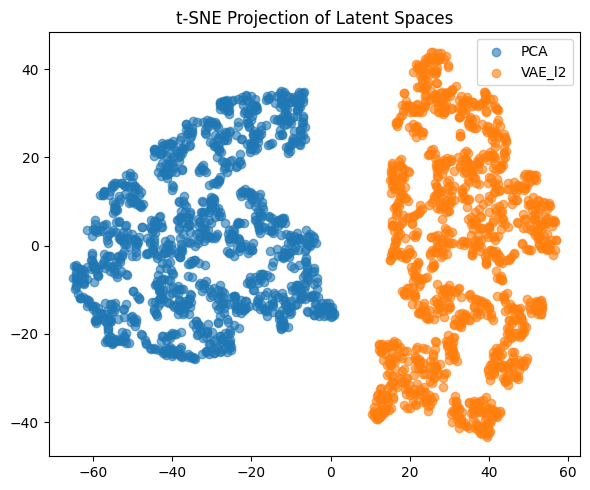


vae_l2 vs ae - trajectories and t-sne


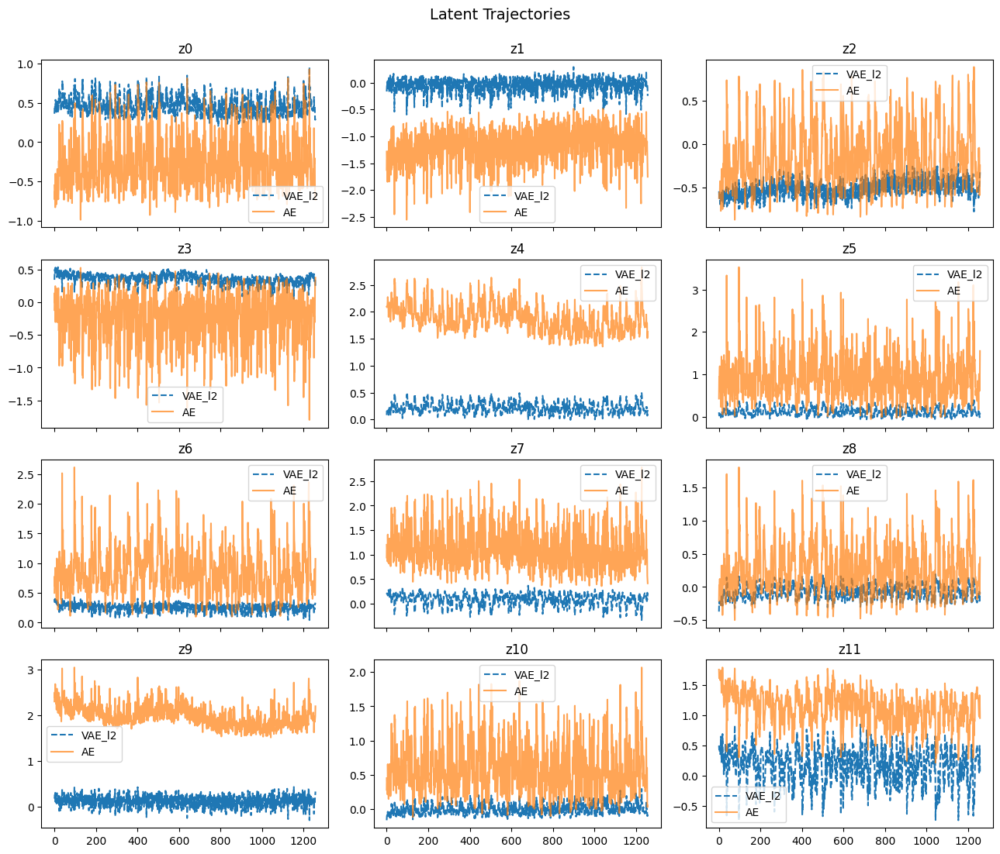

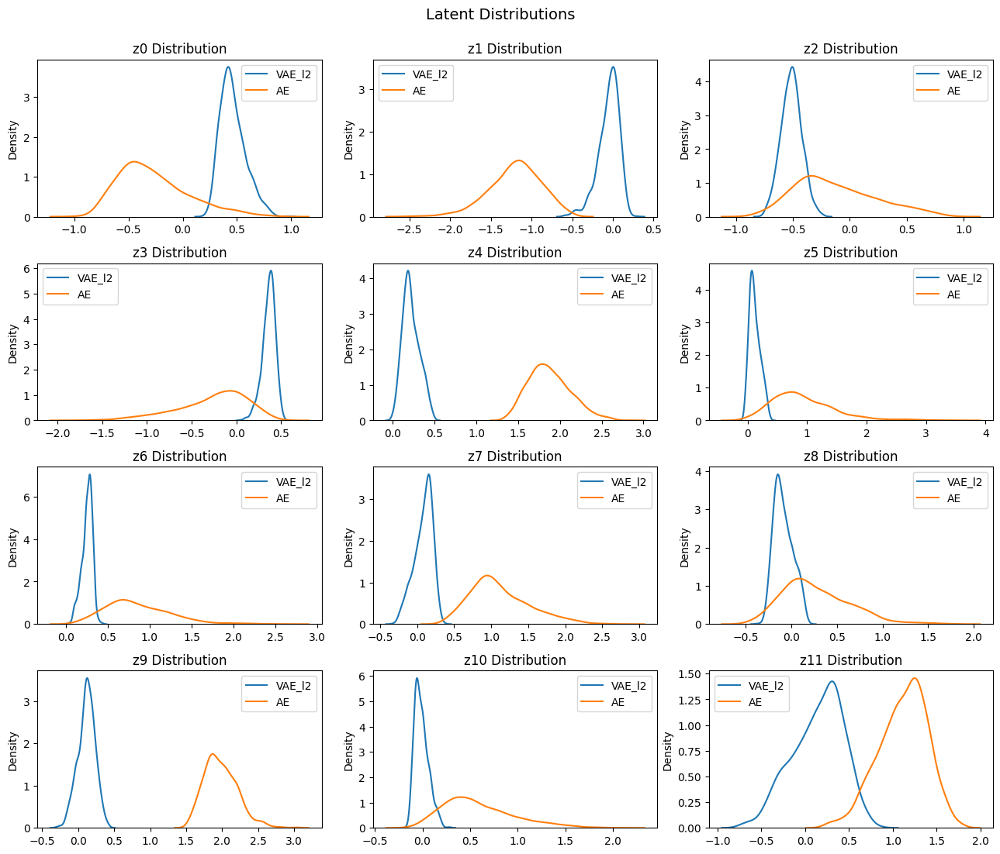

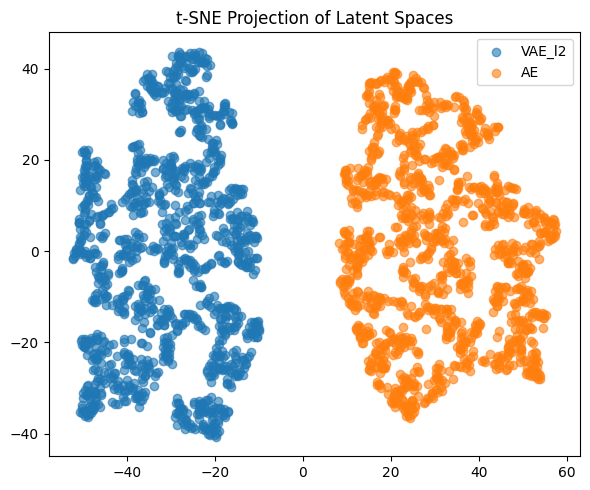


reconstruction rmse comparison:
• pca     rmse: 0.003108
• ae      rmse: 0.015214
• vae_l2  rmse: 0.070951


In [21]:
import importlib
import utils.eval
importlib.reload(utils.eval)
from utils.eval import compare_latent_spaces

# rebuild full dataset for latent evaluation
full_dataset = FeatureToSurfaceDataset(
   surface_tensor=tensors["surface_tensor"],
   feature_tensor=X_feat_tensor,
   date_tensor=tensors["date_tensor"]
)
X_full = full_dataset.to_tensor()

# encode full dataset with ae and vae
Z_ae = ops.convert_to_numpy(ae.encoder_net(X_full))
Z_vae_l2 = ops.convert_to_numpy(vae_l2.encoder(X_full)[1])  # z_mean

# latent space comparison: pca vs vae_l2
print("\npca vs vae_l2 - trajectories and t-sne")
compare_latent_spaces(
   Z_a=Z_pca,
   Z_b=Z_vae_l2,
   valid_mask=None,
   labels=("PCA", "VAE_l2"),
   method="trajectory",
   full_analysis=True
)

compare_latent_spaces(
   Z_a=Z_pca,
   Z_b=Z_vae_l2,
   valid_mask=None,
   labels=("PCA", "VAE_l2"),
   method="tsne"
)

# latent space comparison: vae_l2 vs ae
print("\nvae_l2 vs ae - trajectories and t-sne")
compare_latent_spaces(
   Z_a=Z_vae_l2,
   Z_b=Z_ae,
   valid_mask=None,
   labels=("VAE_l2", "AE"),
   method="trajectory",
   full_analysis=True
)

compare_latent_spaces(
   Z_a=Z_vae_l2,
   Z_b=Z_ae,
   valid_mask=None,
   labels=("VAE_l2", "AE"),
   method="tsne"
)

# final rmse printout
print("\nreconstruction rmse comparison:")
print(f"• pca     rmse: {rmse_pca:.6f}")
print(f"• ae      rmse: {rmse_ae:.6f}")
print(f"• vae_l2  rmse: {rmse_vae_l2:.6f}")

In [22]:
import importlib
import models.vae_l2
importlib.reload(models.vae_l2)

from keras.optimizers import Adam
from models.vae_l2 import VAE, build_encoder, build_decoder
import os

# create output directory
os.makedirs("saved_models/vae_l2_batch", exist_ok=True)

# config
vae_beta = 0.3
vae_latent_dim = LATENT_DIM
vae_l2_penalty = 5e-6
optimizer_l2 = Adam(1e-5)
EPOCHS = 100

# init vae model for batch training
input_dim = train_dataset[0][0].shape[1]
encoder_l2 = build_encoder(input_dim=input_dim, latent_dim=vae_latent_dim, l2_penalty=vae_l2_penalty)
decoder_l2 = build_decoder(output_dim=input_dim, latent_dim=vae_latent_dim, l2_penalty=vae_l2_penalty)
vae_l2 = VAE(encoder=encoder_l2, decoder=decoder_l2, beta=vae_beta, kl_warmup=True)
vae_l2.compile(optimizer=optimizer_l2)

# train using dataset batches
vae_l2.fit_batches(train_dataset, val_dataset=val_dataset, epochs=EPOCHS, verbose=True)

vae_l2(train_dataset[0][0])  # build model

# save components
vae_l2.save("saved_models/vae_l2_batch/vae_l2_model.keras")
vae_l2.encoder.save("saved_models/vae_l2_batch/vae_l2_encoder.keras")
vae_l2.decoder.save("saved_models/vae_l2_batch/vae_l2_decoder.keras")


epoch 1/100
{'loss': 0.09549378603696823, 'reconstruction_loss': 0.09549378603696823, 'kl_loss': 0.060152649879455566, 'z_mean_std': 0.2609283924102783, 'z_logvar_mean': -0.13746081292629242}

epoch 2/100
{'loss': 0.0924028754234314, 'reconstruction_loss': 0.09222228825092316, 'kl_loss': 0.060173582285642624, 'z_mean_std': 0.2592344582080841, 'z_logvar_mean': -0.16310212016105652}

epoch 3/100
{'loss': 0.08913204818964005, 'reconstruction_loss': 0.08876075595617294, 'kl_loss': 0.061022862792015076, 'z_mean_std': 0.25880342721939087, 'z_logvar_mean': -0.18772093951702118}

epoch 4/100
{'loss': 0.08649549633264542, 'reconstruction_loss': 0.0859096348285675, 'kl_loss': 0.0628449022769928, 'z_mean_std': 0.2599925100803375, 'z_logvar_mean': -0.21195557713508606}

epoch 5/100
{'loss': 0.08392909169197083, 'reconstruction_loss': 0.08310101926326752, 'kl_loss': 0.06525071710348129, 'z_mean_std': 0.26191800832748413, 'z_logvar_mean': -0.2352825552225113}

epoch 6/100
{'loss': 0.081730201840400

### Evan with batching L2 is posteriro variance collapse

In [23]:
from utils.eval import evaluate_forecast, print_evaluation
from keras import ops

print("\nevaluating batch-trained vae-l2 model")

X_test_tensor = test_dataset.to_tensor()

# forward metrics
test_metrics = vae_l2.test_step((X_test_tensor, X_test_tensor))
recon_loss = float(test_metrics["reconstruction_loss"])
kl_div = float(test_metrics["kl_loss"])
z_std = float(test_metrics["z_mean_std"])

# print tracked metrics
print(f"\ntest loss breakdown (vae-l2 batch):")
print(f"• reconstruction ≈ {recon_loss:.6f} | kl ≈ {kl_div:.6f} | z_std ≈ {z_std:.6f}")
print(" surface reconstructions are accurate." if recon_loss < 1e-3 else " reconstruction error higher than expected.")
print(" kl term is small - posterior close to prior." if kl_div < 1e-2 else " kl term is high - might overpower reconstruction.")
print(" latent space compressed but active." if 1e-3 < z_std < 0.05 else " latent space underutilized or too dispersed.")

# decoding and rmse/mae - fix here 
X_decoded = vae_l2(X_test_tensor, training=False)
X_true_np = ops.convert_to_numpy(X_test_tensor)
X_pred_np = ops.convert_to_numpy(X_decoded) # convert to numpy !!

mse, mae, _, _ = evaluate_forecast(X_true_np, X_pred_np)
print_evaluation(mse, mae, label="vae-l2 batch (pointwise)")


evaluating batch-trained vae-l2 model

test loss breakdown (vae-l2 batch):
• reconstruction ≈ 0.029069 | kl ≈ 0.030555 | z_std ≈ 0.136014
 reconstruction error higher than expected.
 kl term is high - might overpower reconstruction.
 latent space underutilized or too dispersed.
vae-l2 batch (pointwise) MSE: 0.012784 | MAE: 0.047885


15/40 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - kl_loss: 4.9314e-04 - loss: 0.0126 - reconstruction_loss: 0.0124 - z_logvar_mean: -0.0237 - z_mean_std: 0.0202

c:\Users\alessandro.esposito\source\repos\imperial\.venv\lib\site-packages\keras\src\saving\saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 38 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - kl_loss: 4.6028e-04 - loss: 0.0127 - reconstruction_loss: 0.0126 - z_logvar_mean: -0.0223 - z_mean_std: 0.0198
Surface reconstruction RMSE: 0.0994


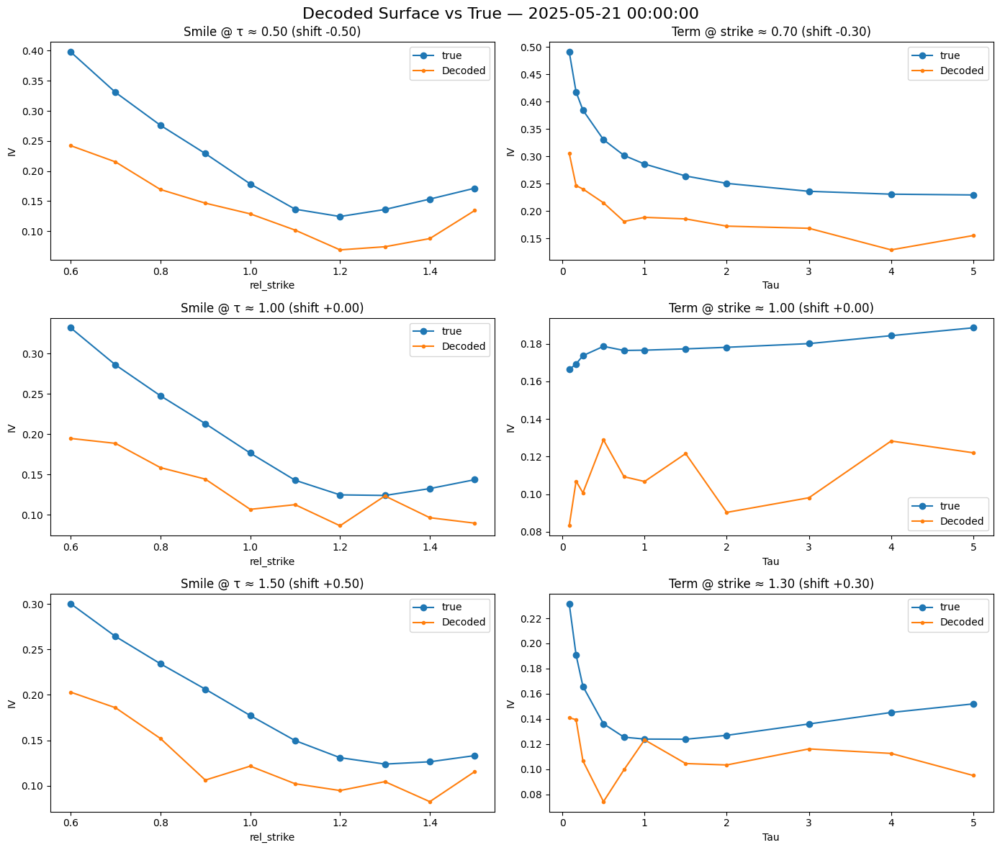

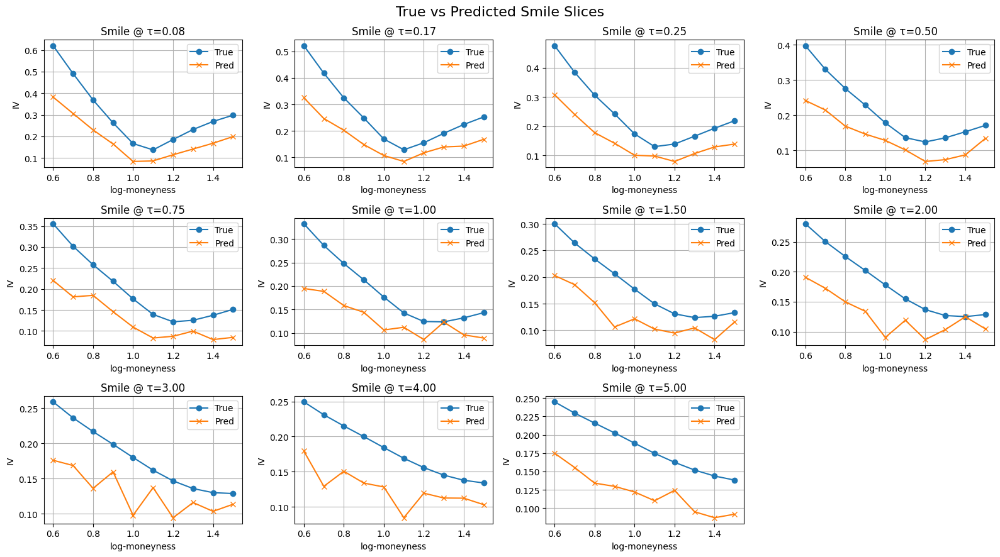

In [24]:
from models.vae_l2 import VAE, build_encoder, build_decoder
from keras.optimizers import Adam
from keras import ops
import pandas as pd
from data.dataset import FeatureToSurfaceDataset

# load full dataset
if USE_DATASET:
   full_dataset = FeatureToSurfaceDataset(
       surface_tensor=tensors["surface_tensor"],
       feature_tensor=X_feat_tensor,
       date_tensor=tensors["date_tensor"],
       batch_size=None
   )
   X_combined_tensor = full_dataset.to_tensor()
else:
   X_combined_tensor = X_combined

input_dim = X_combined_tensor.shape[1]

# rebuild and load vae-l2 batch model
vae_l2_b = VAE(
   encoder=build_encoder(input_dim, vae_latent_dim, vae_l2_penalty),
   decoder=build_decoder(input_dim, vae_latent_dim, vae_l2_penalty),
   beta=vae_beta, kl_warmup=False
)
vae_l2_b.compile(optimizer=Adam(1e-4))
vae_l2_b(ops.convert_to_tensor(X_combined_tensor[:1]))  # build
vae_l2_b.load_weights("saved_models/vae_l2_batch/vae_l2_model.keras")

# encode + evaluate
Z_vae_l2_b = ops.convert_to_numpy(vae_l2_b.encoder(X_combined_tensor)[1])

flat_len = M * K
X_surface = ops.convert_to_numpy(X_combined_tensor[:, :flat_len])
X_features = ops.convert_to_numpy(X_combined_tensor[:, flat_len:])

rmse_vae_l2_batch, X_recon_surf_b, X_true_surf_b = evaluate_encoder(
   encoder=vae_l2_b,
   X_surface=X_surface,
   X_features=X_features,
   M=M, K=K
)

# select target date
TARGET_DATE = pd.Timestamp("2025-05-21")
target_idx = np.where(tensors["date_tensor"] == TARGET_DATE)[0][0]
surface_idx = target_idx  # full dataset so direct match

# visualize surface
plot_iv_slices_shifts(
   true_surface=X_true_surf_b[surface_idx],
   decoded_surface=X_recon_surf_b[surface_idx],
   taus=tensors["taus"],
   rel_strikes=tensors["rel_strikes"],
   decoded_date=TARGET_DATE,
   target_tau=TARGET_TAU,
   target_strike=TARGET_STRIKE
)

plot_smile_slices_comparison(
   true_surface=X_true_surf_b[surface_idx],
   pred_surface=X_recon_surf_b[surface_idx],
   rel_strikes=tensors["rel_strikes"],
   taus=tensors["taus"]
)

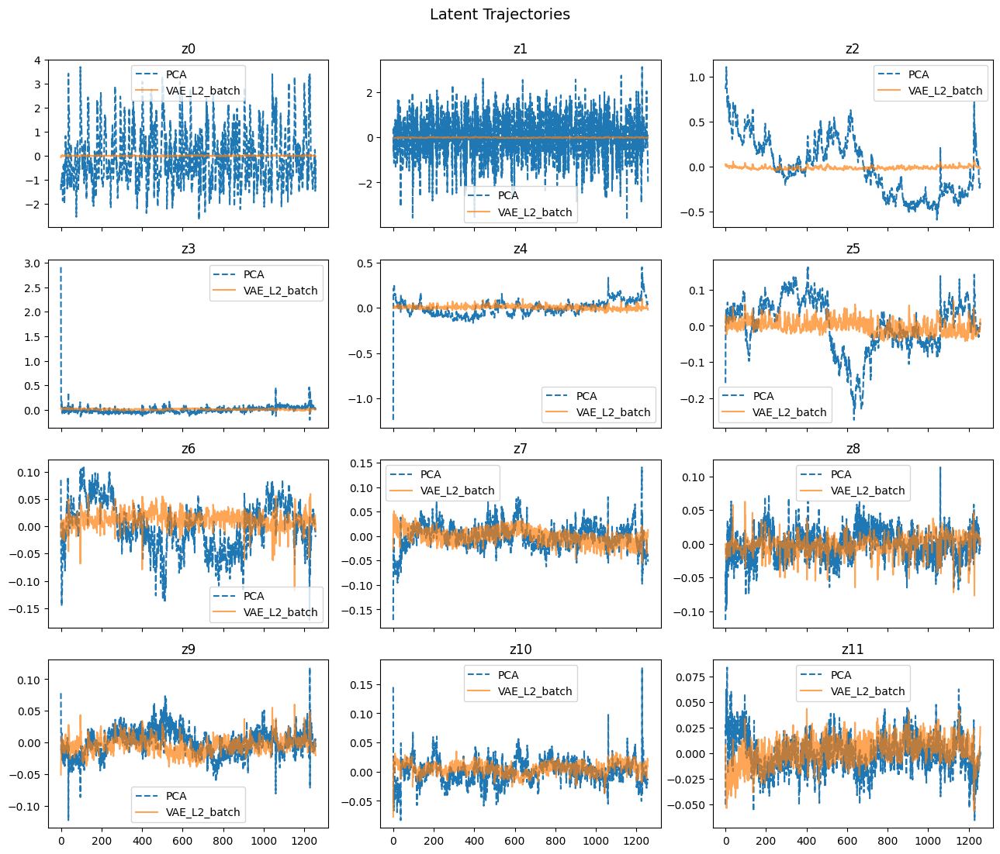

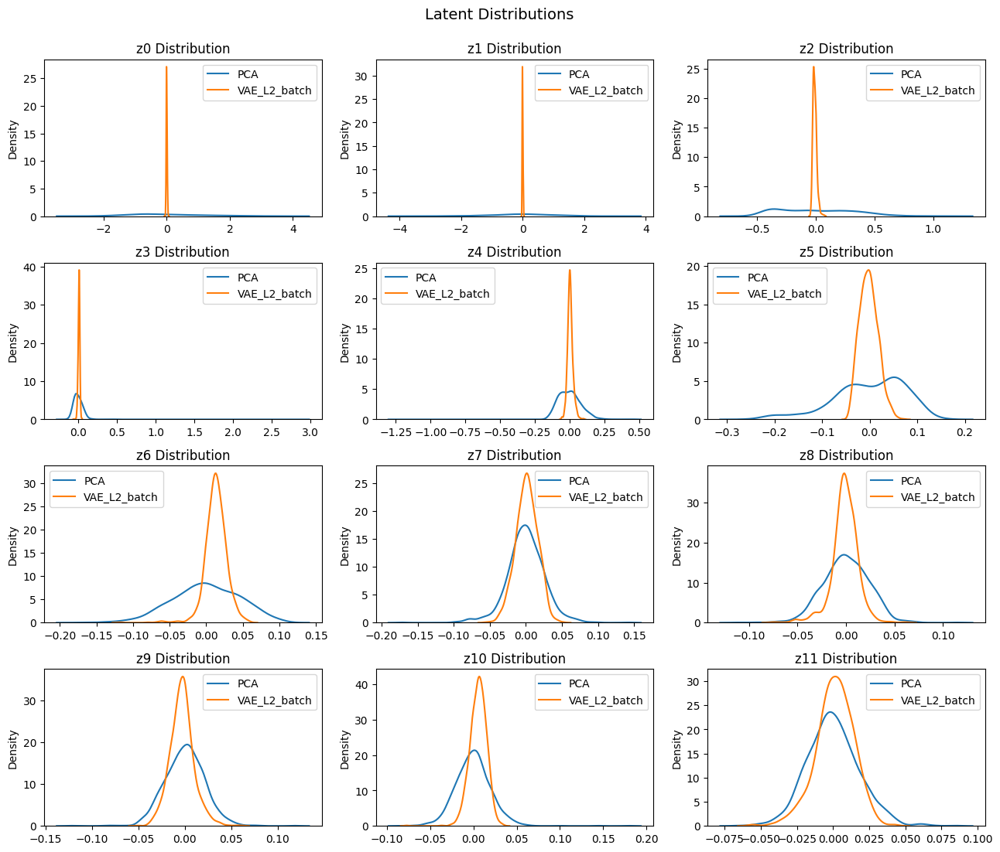

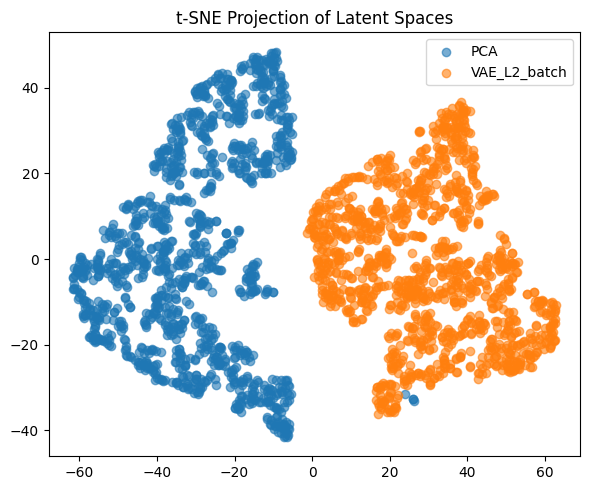

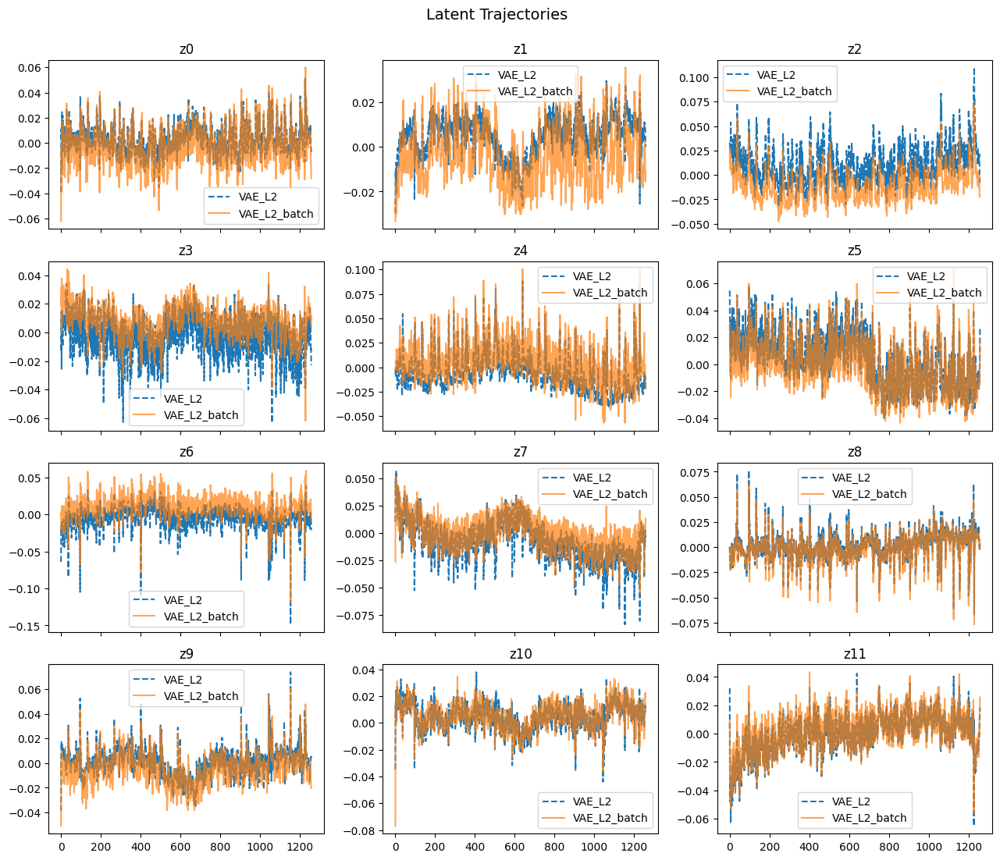

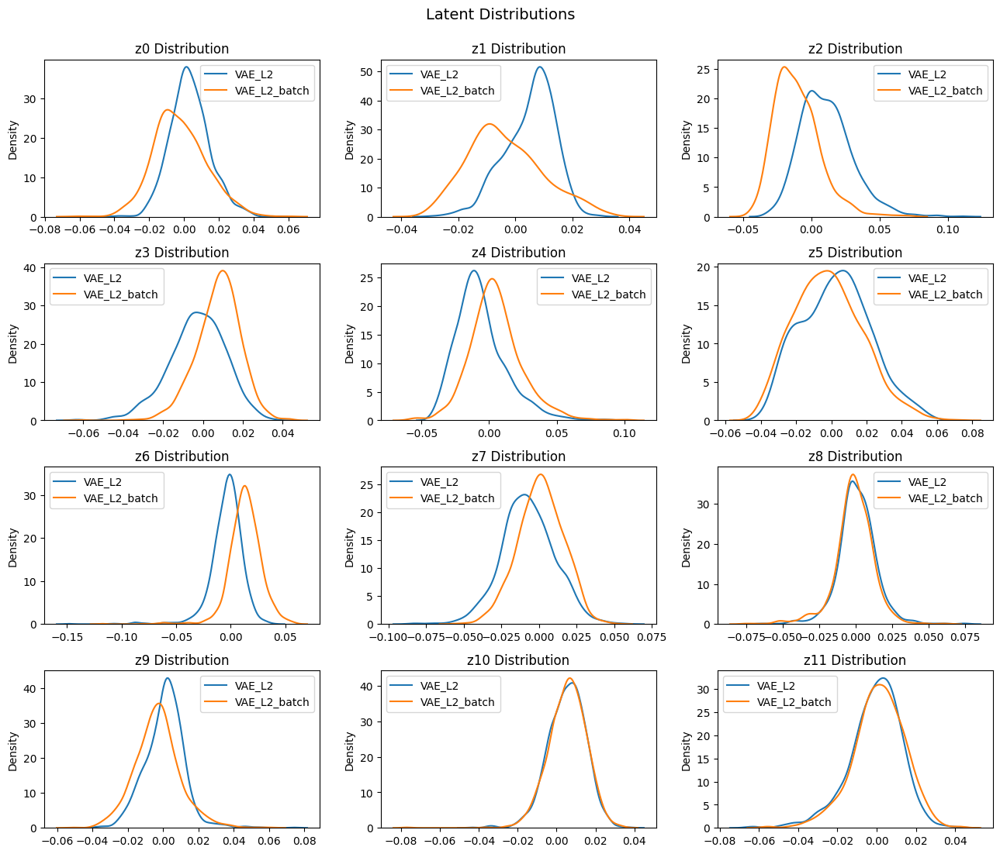

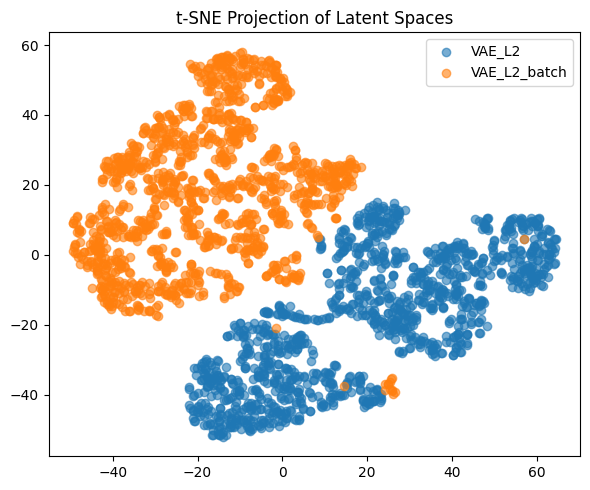


final reconstruction rmse comparison:
• pca              rmse: 0.003108
• ae               rmse: 0.015214
• vae_l2           rmse: 0.070951
• vae_l2 (batch)   rmse: 0.099443


In [25]:
import importlib
import utils.eval
importlib.reload(utils.eval)
from utils.eval import compare_latent_spaces

# full dataset input
full_dataset = FeatureToSurfaceDataset(
   surface_tensor=tensors["surface_tensor"],
   feature_tensor=X_feat_tensor,
   date_tensor=tensors["date_tensor"]
)
X_full = full_dataset.to_tensor()

# latent encodings
Z_ae        = ops.convert_to_numpy(ae.encoder_net(X_full))
Z_vae_l2    = ops.convert_to_numpy(vae_l2.encoder(X_full)[1])       # .fit model
Z_vae_l2_b  = ops.convert_to_numpy(vae_l2_b.encoder(X_full)[1])     # .fit_batches model

# compare pca vs vae_l2 (batch)
compare_latent_spaces(Z_pca, Z_vae_l2_b, valid_mask=None, labels=("PCA", "VAE_L2_batch"), method="trajectory", full_analysis=True)
compare_latent_spaces(Z_pca, Z_vae_l2_b, valid_mask=None, labels=("PCA", "VAE_L2_batch"), method="tsne")

# compare vae_l2 vs vae_l2_batch
compare_latent_spaces(Z_vae_l2, Z_vae_l2_b, valid_mask=None, labels=("VAE_L2", "VAE_L2_batch"), method="trajectory", full_analysis=True)
compare_latent_spaces(Z_vae_l2, Z_vae_l2_b, valid_mask=None, labels=("VAE_L2", "VAE_L2_batch"), method="tsne")

# rmse already evaluated earlier
print("\nfinal reconstruction rmse comparison:")
print(f"• pca              rmse: {rmse_pca:.6f}")
print(f"• ae               rmse: {rmse_ae:.6f}")
print(f"• vae_l2           rmse: {rmse_vae_l2:.6f}")
print(f"• vae_l2 (batch)   rmse: {rmse_vae_l2_batch:.6f}")

In [26]:
import importlib
import models.vae_l1
importlib.reload(models.vae_l1)

from keras.optimizers import Adam
from keras.callbacks import ModelCheckpoint, ReduceLROnPlateau, EarlyStopping
from models.vae_l1 import VAE, build_encoder, build_decoder, VAETrainingDebugCallback, KLEpochTracker
import os

# output directory
os.makedirs("saved_models/vae_l1", exist_ok=True)

# config
optimizer_l1 = Adam(1e-5)
vae_beta_l1 = 0.9
vae_latent_dim_l1 = LATENT_DIM
X_train = train_dataset.to_tensor()
X_val   = val_dataset.to_tensor()

# encoder / decoder
encoder_l1 = build_encoder(X_train.shape[1], vae_latent_dim_l1)
decoder_l1 = build_decoder(X_train.shape[1], vae_latent_dim_l1)
vae_l1 = VAE(encoder=encoder_l1, decoder=decoder_l1, beta=vae_beta_l1, kl_warmup=True)
vae_l1.compile(optimizer=optimizer_l1)

# callbacks
callbacks_l1 = [
   KLEpochTracker(vae_l1),
   VAETrainingDebugCallback(vae_model=vae_l1, X_val=X_val),
   ModelCheckpoint("saved_models/vae_l1/vae_l1.weights.h5", monitor="val_loss", save_best_only=True, save_weights_only=True),
   ReduceLROnPlateau(monitor="val_loss", factor=0.5, patience=5),
   EarlyStopping(monitor="val_loss", patience=10, restore_best_weights=False)
]

# train
history_vae_l1 = vae_l1.fit(
   X_train, X_train,
   validation_data=(X_val, X_val),
   epochs=100,
   batch_size=32,
   callbacks=callbacks_l1,
   verbose=1
)

# save
vae_l1.save("saved_models/vae_l1/vae_l1_model.keras")
vae_l1.encoder.save("saved_models/vae_l1/vae_l1_encoder.keras")
vae_l1.decoder.save("saved_models/vae_l1/vae_l1_decoder.keras")

Epoch 1/100
26/28 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - kl_loss: 0.0479 - loss: 0.2528 - reconstruction_loss: 0.2528 - z_logvar_mean: -0.0294 - z_mean_std: 0.2506[vae_mle_debug | epoch 001] recon l1: 0.232284 | z_std: 0.2238 | z_mean_abs: 0.1819 | z_logvar_mean: -0.0527
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - kl_loss: 0.0479 - loss: 0.2525 - reconstruction_loss: 0.2525 - z_logvar_mean: -0.0308 - z_mean_std: 0.2502 - val_kl_loss: 0.0403 - val_loss: 0.2307 - val_reconstruction_loss: 0.2307 - val_z_logvar_mean: -0.0530 - val_z_mean_std: 0.2191 - learning_rate: 1.0000e-05
Epoch 2/100
27/28 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - kl_loss: 0.0456 - loss: 0.2430 - reconstruction_loss: 0.2421 - z_logvar_mean: -0.0833 - z_mean_std: 0.2301[vae_mle_debug | epoch 002] recon l1: 0.218633 | z_std: 0.2036 | z_mean_abs: 0.1775 | z_logvar_mean: -0.0984
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - kl_loss: 0.0456 - loss: 0.2428 - reconstruction_loss: 0.2419 - z_logvar_mean: -0.0842 - z_mean_std: 0.2295 - val_k

### Varinace collapsed again ...

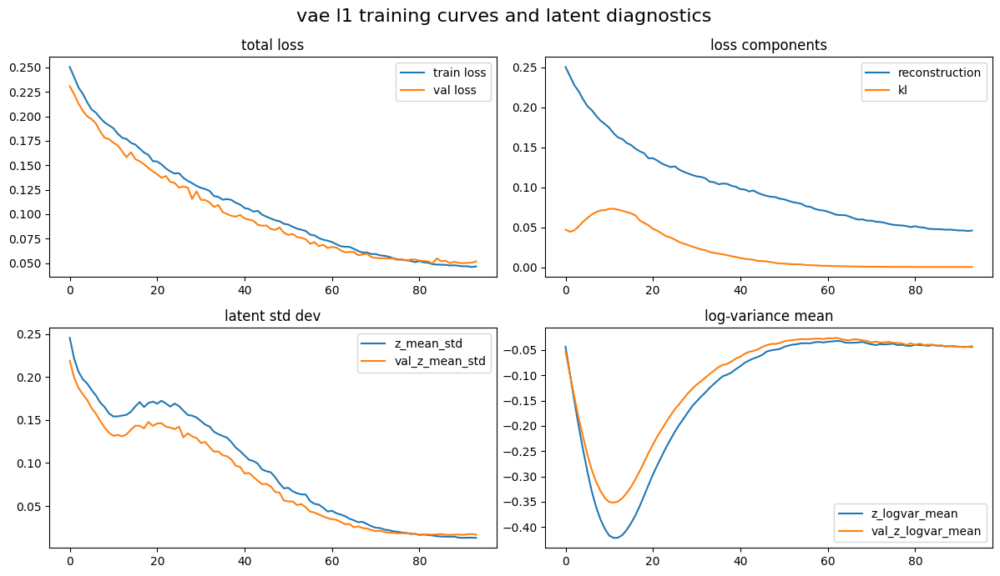

In [27]:
import matplotlib.pyplot as plt

fig, axs = plt.subplots(2, 2, figsize=(12, 7))
plt.suptitle("vae l1 training curves and latent diagnostics", fontsize=16)

# top row: loss curves
axs[0, 0].plot(history_vae_l1.history["loss"], label="train loss")
axs[0, 0].plot(history_vae_l1.history.get("val_loss", []), label="val loss")
axs[0, 0].set_title("total loss")
axs[0, 0].legend()

axs[0, 1].plot(history_vae_l1.history.get("reconstruction_loss", []), label="reconstruction")
axs[0, 1].plot(history_vae_l1.history.get("kl_loss", []), label="kl")
axs[0, 1].set_title("loss components")
axs[0, 1].legend()

# bottom row: latent diagnostics
axs[1, 0].plot(history_vae_l1.history.get("z_mean_std", []), label="z_mean_std")
axs[1, 0].plot(history_vae_l1.history.get("val_z_mean_std", []), label="val_z_mean_std")
axs[1, 0].set_title("latent std dev")
axs[1, 0].legend()

axs[1, 1].plot(history_vae_l1.history.get("z_logvar_mean", []), label="z_logvar_mean")
axs[1, 1].plot(history_vae_l1.history.get("val_z_logvar_mean", []), label="val_z_logvar_mean")
axs[1, 1].set_title("log-variance mean")
axs[1, 1].legend()

plt.tight_layout()
plt.show()

In [28]:
from utils.eval import evaluate_forecast, print_evaluation
from keras import ops

print("\nevaluating vae-l1 on featuretosurfacedataset")
X_test_tensor = test_dataset.to_tensor()

# evaluate model metrics
test_metrics_l1 = vae_l1.evaluate(X_test_tensor, X_test_tensor, verbose=0)
recon_loss_l1, kl_div_l1, z_mean_std_l1, *rest = [float(x) for x in test_metrics_l1]

print(f"\ntest loss breakdown (vae-l1):")
print(f"• reconstruction ≈ {recon_loss_l1:.6f} | kl ≈ {kl_div_l1:.6f} | z_std ≈ {z_mean_std_l1:.6f}")
print(" surface reconstructions are accurate." if recon_loss_l1 < 1e-3 else " reconstruction error higher than expected.")
print(" kl term is small - posterior close to prior." if kl_div_l1 < 1e-2 else " kl term is high - might overpower reconstruction.")
print(" latent space compressed but active." if 1e-3 < z_mean_std_l1 < 0.05 else " latent space underutilized or too dispersed.")

# pointwise decoding rmse/mae
X_decoded_l1 = vae_l1.predict(X_test_tensor, verbose=0)
X_true_np = ops.convert_to_numpy(X_test_tensor)

mse_l1, mae_l1, _, _ = evaluate_forecast(X_true_np, X_decoded_l1)
print_evaluation(mse_l1, mae_l1, label="vae-l1 surface (pointwise)")


evaluating vae-l1 on featuretosurfacedataset

test loss breakdown (vae-l1):
• reconstruction ≈ 0.048077 | kl ≈ 0.047446 | z_std ≈ 0.000702
 reconstruction error higher than expected.
 kl term is high - might overpower reconstruction.
 latent space underutilized or too dispersed.
vae-l1 surface (pointwise) MSE: 0.013029 | MAE: 0.047041


13/40 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - kl_loss: 0.0098 - loss: 0.0465 - reconstruction_loss: 0.0465 - z_logvar_mean: -0.1023 - z_mean_std: 0.0643

c:\Users\alessandro.esposito\source\repos\imperial\.venv\lib\site-packages\keras\src\saving\saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 38 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - kl_loss: 0.0450 - loss: 0.0436 - reconstruction_loss: 0.0436 - z_logvar_mean: -0.2465 - z_mean_std: 0.1207
Surface reconstruction RMSE: 0.0518


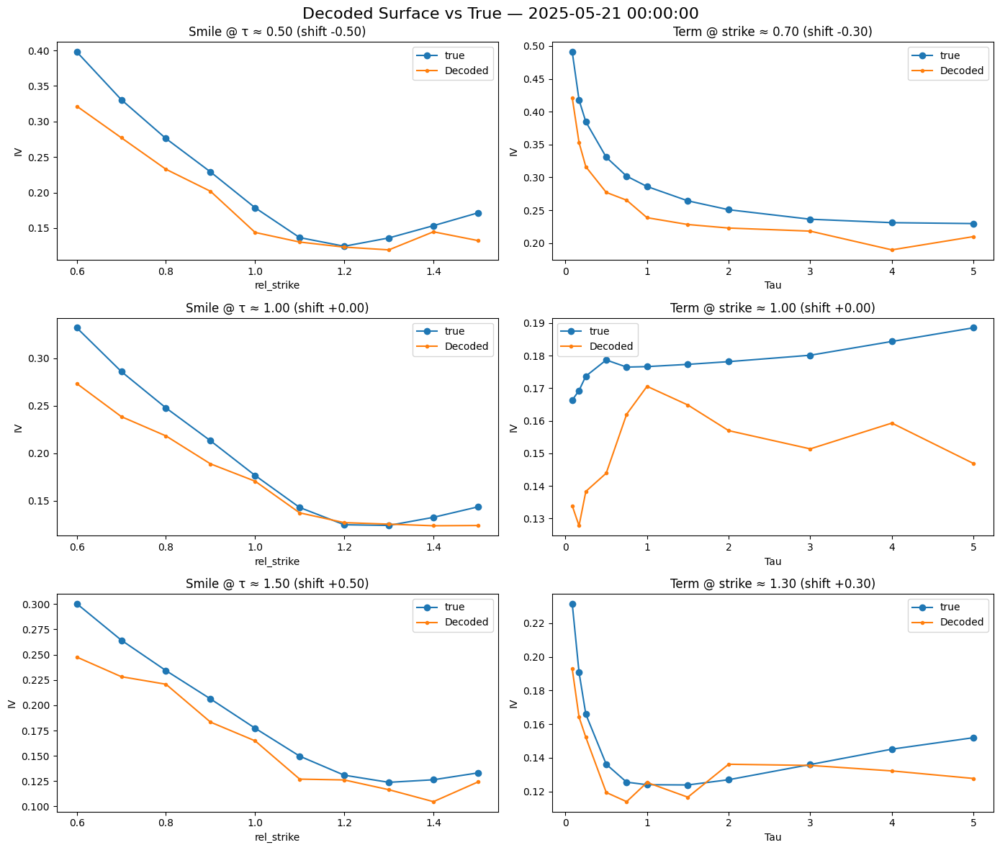

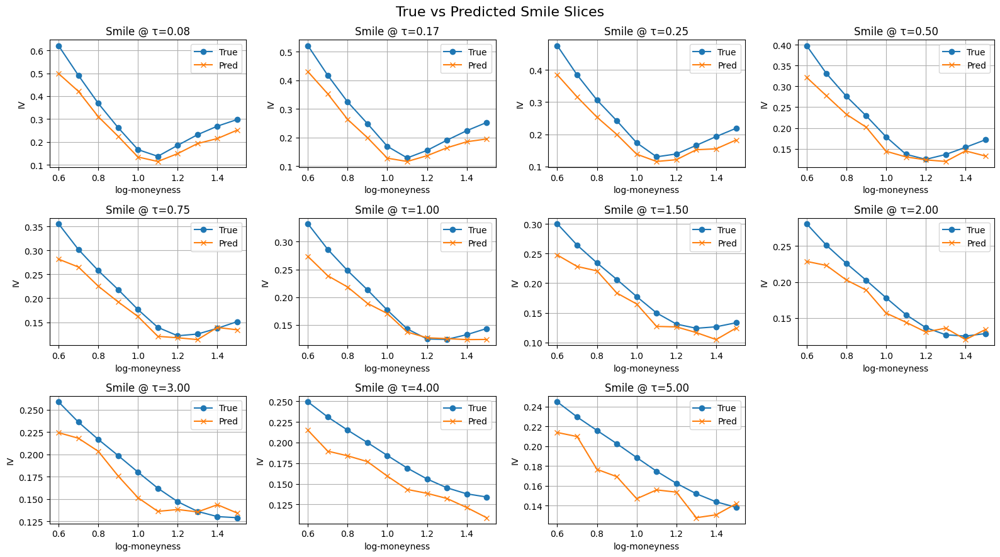

In [29]:
from models.vae_l1 import VAE, build_encoder, build_decoder
from keras.optimizers import Adam
from keras import ops
import pandas as pd
from data.dataset import FeatureToSurfaceDataset

# load full dataset
X_full = FeatureToSurfaceDataset(
   surface_tensor=tensors["surface_tensor"],
   feature_tensor=X_feat_tensor,
   date_tensor=tensors["date_tensor"],
   batch_size=None
).to_tensor()

input_dim = X_full.shape[1]

# build and load model
encoder_l1 = build_encoder(input_dim=input_dim, latent_dim=vae_latent_dim)
decoder_l1 = build_decoder(output_dim=input_dim, latent_dim=vae_latent_dim)

vae_l1 = VAE(encoder=encoder_l1, decoder=decoder_l1, beta=vae_beta, kl_warmup=True)
vae_l1.compile(optimizer=Adam(1e-4))
vae_l1(X_full[:1])  # build
vae_l1.load_weights("saved_models/vae_l1/vae_l1.weights.h5")

# encode
_, z_mean_l1, _ = vae_l1.encoder(X_full)
Z_vae_l1 = ops.convert_to_numpy(z_mean_l1)

# evaluate reconstruction
flat_len = M * K
X_surface = ops.convert_to_numpy(X_full[:, :flat_len])
X_features = ops.convert_to_numpy(X_full[:, flat_len:])

rmse_vae_l1, X_recon_surf_vae_l1, X_true_surf_vae_l1 = evaluate_encoder(
   encoder=vae_l1,
   X_surface=X_surface,
   X_features=X_features,
   M=M, K=K
)

# select target date
TARGET_DATE = pd.Timestamp("2025-05-21")
target_idx = np.where(tensors["date_tensor"] == TARGET_DATE)[0][0]
surface_idx = target_idx

# visualize decoded vs true surface
plot_iv_slices_shifts(
   true_surface=X_true_surf_vae_l1[surface_idx],
   decoded_surface=X_recon_surf_vae_l1[surface_idx],
   taus=tensors["taus"],
   rel_strikes=tensors["rel_strikes"],
   decoded_date=TARGET_DATE,
   target_tau=TARGET_TAU,
   target_strike=TARGET_STRIKE
)

plot_smile_slices_comparison(
   true_surface=X_true_surf_vae_l1[surface_idx],
   pred_surface=X_recon_surf_vae_l1[surface_idx],
   rel_strikes=tensors["rel_strikes"],
   taus=tensors["taus"]
)


 PCA vs VAE_l1 - trajectories and t-sne


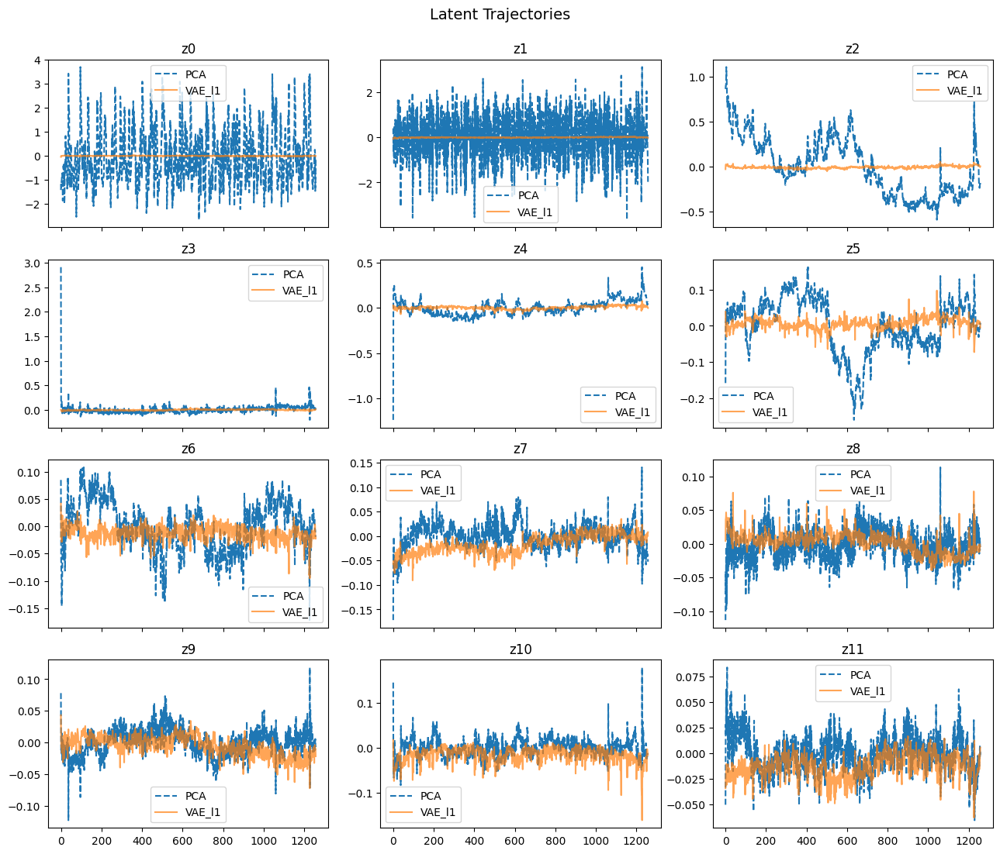

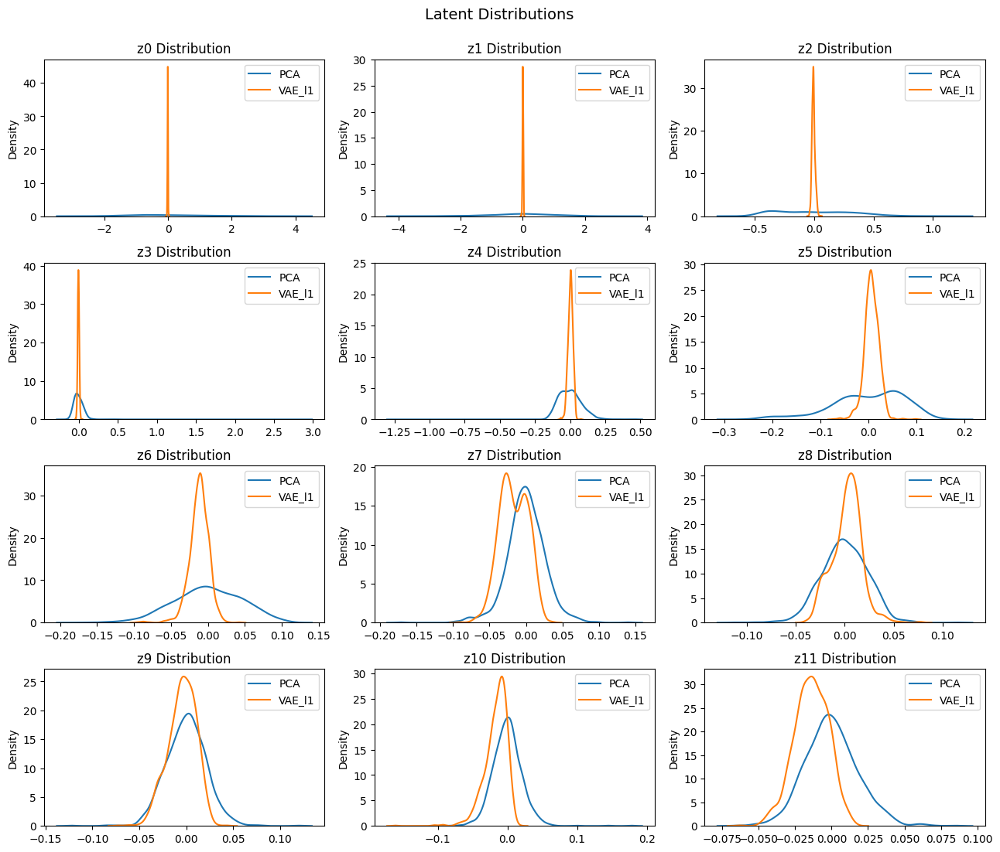

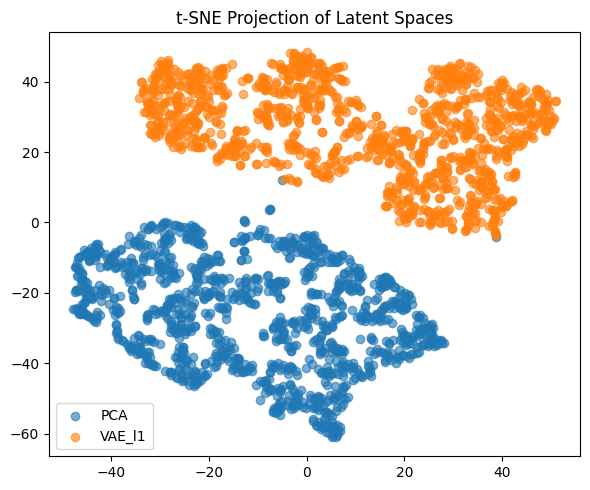


reconstruction rmse comparison:
• pca          rmse: 0.003108
• ae           rmse: 0.015214
• vae_l1       rmse: 0.051787
• vae_l2       rmse: 0.070951
• vae_l2_batch rmse: 0.099443


In [30]:
import importlib
import utils.eval
importlib.reload(utils.eval)

from utils.eval import compare_latent_spaces

# pca vs vae_l1
print("\n PCA vs VAE_l1 - trajectories and t-sne")
compare_latent_spaces(
   Z_a=Z_pca,
   Z_b=Z_vae_l1,
   valid_mask=valid_mask,
   labels=("PCA", "VAE_l1"),
   method="trajectory",
   full_analysis=True
)

compare_latent_spaces(
   Z_a=Z_pca,
   Z_b=Z_vae_l1,
   valid_mask=valid_mask,
   labels=("PCA", "VAE_l1"),
   method="tsne"
)

# final rmse printout
print("\nreconstruction rmse comparison:")
print(f"• pca          rmse: {rmse_pca:.6f}")
print(f"• ae           rmse: {rmse_ae:.6f}")
print(f"• vae_l1       rmse: {rmse_vae_l1:.6f}")
print(f"• vae_l2       rmse: {rmse_vae_l2:.6f}")
print(f"• vae_l2_batch rmse: {rmse_vae_l2_batch:.6f}")

In [31]:
import importlib
import models.vae_mle
importlib.reload(models.vae_mle)

from keras.optimizers import Adam
from keras.callbacks import ModelCheckpoint, ReduceLROnPlateau, EarlyStopping
from models.vae_mle import VAE, build_encoder, build_decoder, VAETrainingDebugCallback, KLEpochTracker
import os

# create output directory
os.makedirs("saved_models/vae_mle", exist_ok=True)

# optimizer and config
optimizer_mle = Adam(1e-5)
vae_beta = 0.2
vae_latent_dim = LATENT_DIM
X_train = train_dataset.to_tensor()
X_val   = val_dataset.to_tensor()

# build vae-mle
encoder_mle = build_encoder(input_dim=X_train.shape[1], latent_dim=vae_latent_dim)
decoder_mle = build_decoder(output_dim=X_train.shape[1], latent_dim=vae_latent_dim)
vae_mle = VAE(encoder=encoder_mle, decoder=decoder_mle, beta=vae_beta, kl_warmup=True)
vae_mle.compile(optimizer=optimizer_mle)

# callbacks
debug_cb_mle = VAETrainingDebugCallback(vae_model=vae_mle, X_val=X_val)
callbacks = [
   KLEpochTracker(vae_mle),
   debug_cb_mle,
   ModelCheckpoint("saved_models/vae_mle/vae_mle.weights.h5", monitor="val_loss", save_best_only=True, save_weights_only=True),
   ReduceLROnPlateau(monitor="val_loss", factor=0.5, patience=5),
   EarlyStopping(monitor="val_loss", patience=10, restore_best_weights=False)
]

# train
history_vae_mle = vae_mle.fit(
   X_train, X_train,
   validation_data=(X_val, X_val),
   epochs=300,
   batch_size=32,
   callbacks=callbacks,
   verbose=1
)

# save
vae_mle.save("saved_models/vae_mle/vae_mle_model.keras")
vae_mle.encoder.save("saved_models/vae_mle/vae_mle_encoder.keras")
vae_mle.decoder.save("saved_models/vae_mle/vae_mle_decoder.keras")

Epoch 1/300
27/28 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - kl_loss: 0.0458 - loss: -0.2432 - reconstruction_loss: -0.2432 - z_logvar_mean: -0.1780 - z_std: 0.2192[vae_mle_debug | epoch 001] recon mle: 0.202113 | z_std: 0.1947 | z_mean_abs: 0.1553 | z_logvar_mean: -0.2227
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - kl_loss: 0.0458 - loss: -0.2436 - reconstruction_loss: -0.2436 - z_logvar_mean: -0.1797 - z_std: 0.2188 - val_kl_loss: 0.0425 - val_loss: -0.2741 - val_reconstruction_loss: -0.2741 - val_val_z_logvar_mean: -0.2230 - val_val_z_std: 0.1944 - val_z_logvar_mean: -0.2230 - val_z_std: 0.1944 - learning_rate: 1.0000e-05
Epoch 2/300
26/28 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - kl_loss: 0.0580 - loss: -0.2672 - reconstruction_loss: -0.2674 - z_logvar_mean: -0.2766 - z_std: 0.2273[vae_mle_debug | epoch 002] recon mle: 0.188876 | z_std: 0.2637 | z_mean_abs: 0.2120 | z_logvar_mean: -0.3044
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - kl_loss: 0.0590 - loss: -0.2676 - reconstruction_loss: -0.2678 - z_

### z_std = 1! mle best of the vae encoders so far 

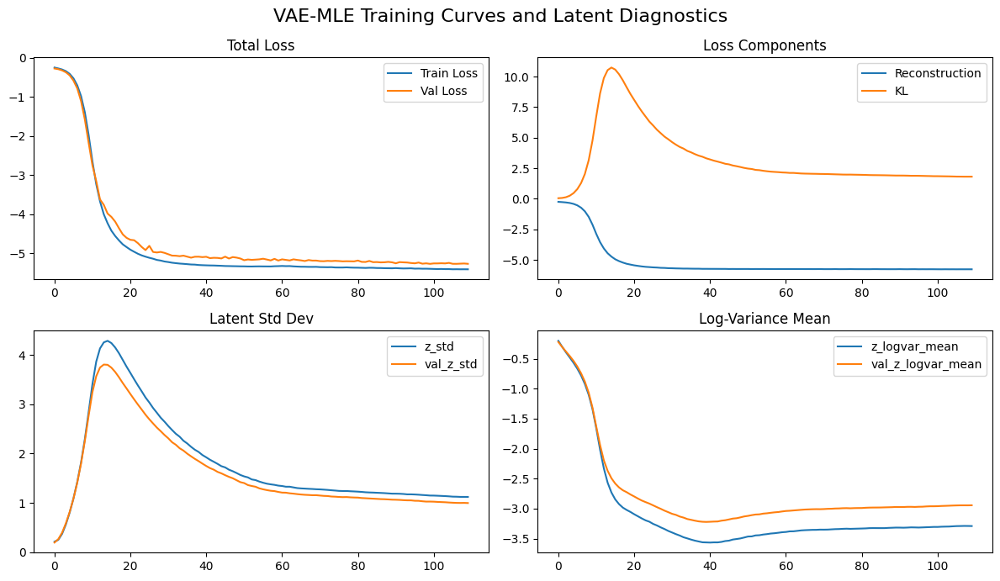

In [32]:
import matplotlib.pyplot as plt

fig, axs = plt.subplots(2, 2, figsize=(12, 7))
plt.suptitle("VAE-MLE Training Curves and Latent Diagnostics", fontsize=16)

axs[0, 0].plot(history_vae_mle.history["loss"], label="Train Loss")
axs[0, 0].plot(history_vae_mle.history.get("val_loss", []), label="Val Loss")
axs[0, 0].set_title("Total Loss")
axs[0, 0].legend()

axs[0, 1].plot(history_vae_mle.history.get("reconstruction_loss", []), label="Reconstruction")
axs[0, 1].plot(history_vae_mle.history.get("kl_loss", []), label="KL")
axs[0, 1].set_title("Loss Components")
axs[0, 1].legend()

axs[1, 0].plot(history_vae_mle.history.get("z_std", []), label="z_std")
axs[1, 0].plot(history_vae_mle.history.get("val_z_std", []), label="val_z_std")

axs[1, 0].set_title("Latent Std Dev")
axs[1, 0].legend()

axs[1, 1].plot(history_vae_mle.history.get("z_logvar_mean", []), label="z_logvar_mean")
axs[1, 1].plot(history_vae_mle.history.get("val_z_logvar_mean", []), label="val_z_logvar_mean")
axs[1, 1].set_title("Log-Variance Mean")
axs[1, 1].legend()

plt.tight_layout()
plt.show()


In [33]:
from utils.eval import evaluate_forecast, print_evaluation
from keras import ops

# evaluation input
X_test_tensor = test_dataset.to_tensor()

# evaluate model metrics on full dataset
test_metrics_mle = vae_mle.evaluate(X_test_tensor, X_test_tensor, verbose=0)
recon_loss_mle, kl_div_mle, z_mean_std_mle, *rest = [float(x) for x in test_metrics_mle]

print(f"\ntest loss breakdown (vae-mle):")
print(f"• reconstruction ≈ {recon_loss_mle:.6f} | kl ≈ {kl_div_mle:.6f} | z_std ≈ {z_mean_std_mle:.6f}")
print(" surface reconstructions are accurate." if recon_loss_mle < 1e-3 else " reconstruction error higher than expected.")
print(" kl term is small - posterior close to prior." if kl_div_mle < 1e-2 else " kl term is high - might overpower reconstruction.")
print(" latent space compressed but active." if 1e-3 < z_mean_std_mle < 0.05 else " latent space underutilized or too dispersed.")

# pointwise decoding rmse/mae
X_decoded_mle = vae_mle.predict(X_test_tensor, verbose=0)
X_true_np = ops.convert_to_numpy(X_test_tensor)

mse_mle, mae_mle, _, _ = evaluate_forecast(X_true_np, X_decoded_mle)
print_evaluation(mse_mle, mae_mle, label="vae-mle surface (pointwise)")


test loss breakdown (vae-mle):
• reconstruction ≈ -5.295378 | kl ≈ -5.618683 | z_std ≈ 1.616529
 surface reconstructions are accurate.
 kl term is small - posterior close to prior.
 latent space underutilized or too dispersed.
vae-mle surface (pointwise) MSE: 0.010454 | MAE: 0.027451


 7/40 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - kl_loss: 1.7816 - loss: -5.7416 - reconstruction_loss: -5.7416 - z_logvar_mean: -3.2183 - z_std: 1.1272

c:\Users\alessandro.esposito\source\repos\imperial\.venv\lib\site-packages\keras\src\saving\saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 50 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


40/40 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - kl_loss: 1.8780 - loss: -5.7502 - reconstruction_loss: -5.7502 - z_logvar_mean: -3.2895 - z_std: 1.1774
Surface reconstruction RMSE: 0.0205


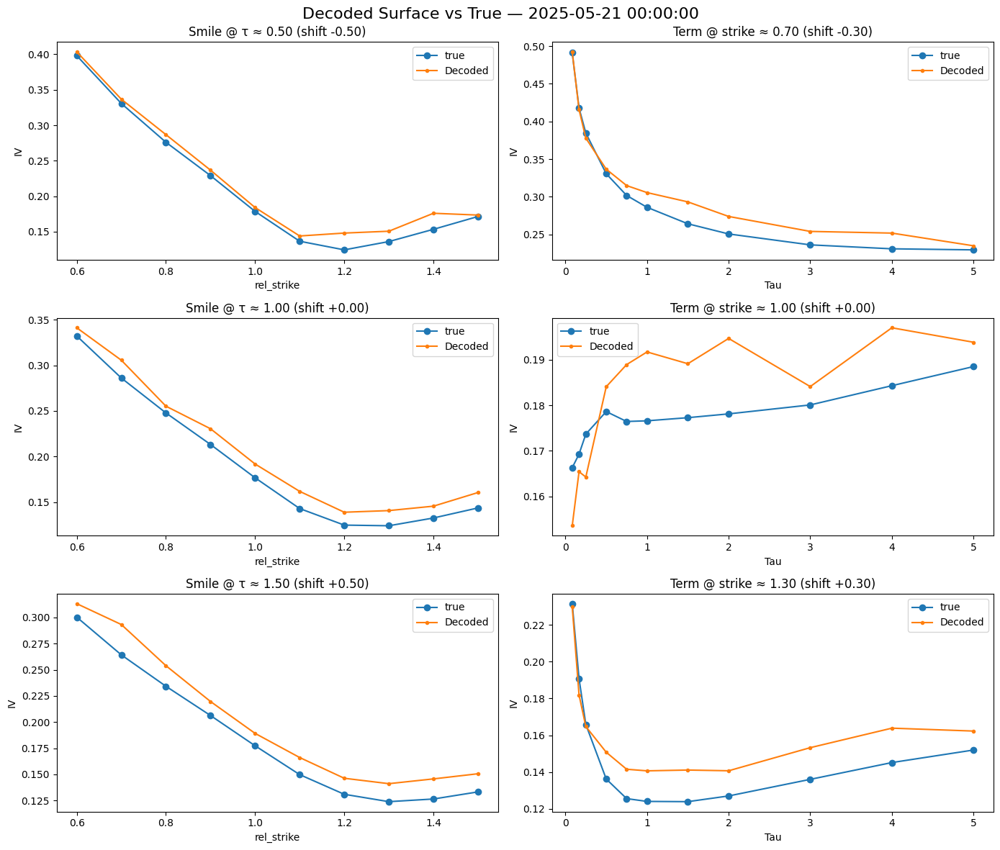

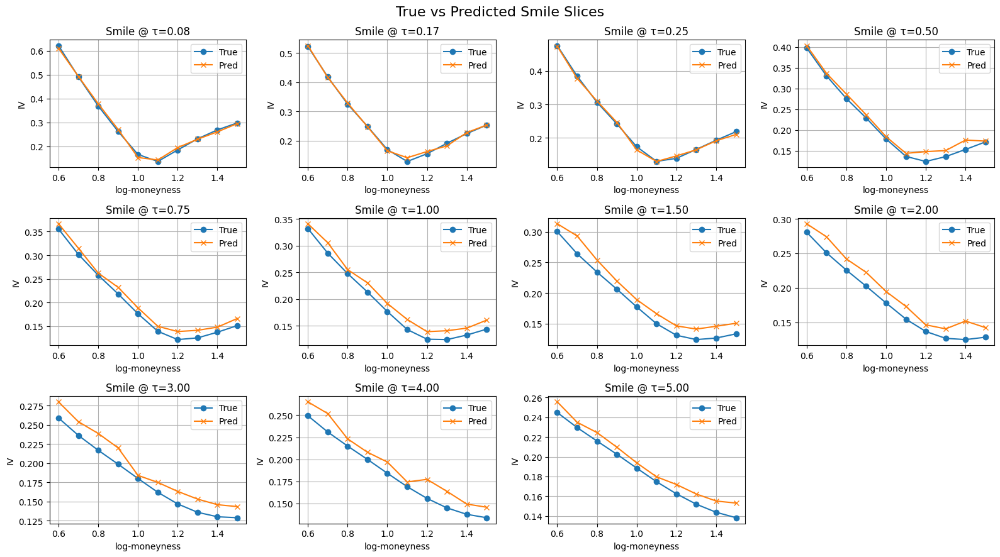

In [34]:
from models.vae_mle import VAE, build_encoder, build_decoder
from keras.optimizers import Adam
from keras import ops
import pandas as pd
from data.dataset import FeatureToSurfaceDataset

# load full dataset
X_full = FeatureToSurfaceDataset(
   surface_tensor=tensors["surface_tensor"],
   feature_tensor=X_feat_tensor,
   date_tensor=tensors["date_tensor"],
   batch_size=None
).to_tensor()

input_dim = X_full.shape[1]

# rebuild and load model
encoder_mle = build_encoder(input_dim=input_dim, latent_dim=vae_latent_dim)
decoder_mle = build_decoder(output_dim=input_dim, latent_dim=vae_latent_dim)

vae_mle = VAE(encoder=encoder_mle, decoder=decoder_mle, beta=vae_beta, kl_warmup=True)
vae_mle.compile(optimizer=Adam(1e-5))
vae_mle(X_full[:1])  # build
vae_mle.load_weights("saved_models/vae_mle/vae_mle.weights.h5")

# encode
_, z_mean_mle, _ = vae_mle.encoder(X_full)
Z_vae_mle = ops.convert_to_numpy(z_mean_mle)

# evaluate reconstruction
flat_len = M * K
X_surface = ops.convert_to_numpy(X_full[:, :flat_len])
X_features = ops.convert_to_numpy(X_full[:, flat_len:])

rmse_vae_mle, X_recon_surf_vae_mle, X_true_surf_vae_mle = evaluate_encoder(
   encoder=vae_mle,
   X_surface=X_surface,
   X_features=X_features,
   M=M, K=K
)

# select target date
TARGET_DATE = pd.Timestamp("2025-05-21")
target_idx = np.where(tensors["date_tensor"] == TARGET_DATE)[0][0]
surface_idx = target_idx

# visualize surface
plot_iv_slices_shifts(
   true_surface=X_true_surf_vae_mle[surface_idx],
   decoded_surface=X_recon_surf_vae_mle[surface_idx],
   taus=tensors["taus"],
   rel_strikes=tensors["rel_strikes"],
   decoded_date=TARGET_DATE,
   target_tau=TARGET_TAU,
   target_strike=TARGET_STRIKE
)

plot_smile_slices_comparison(
   true_surface=X_true_surf_vae_mle[surface_idx],
   pred_surface=X_recon_surf_vae_mle[surface_idx],
   rel_strikes=tensors["rel_strikes"],
   taus=tensors["taus"]
)


 PCA vs VAE-MLE — Trajectories and t-SNE


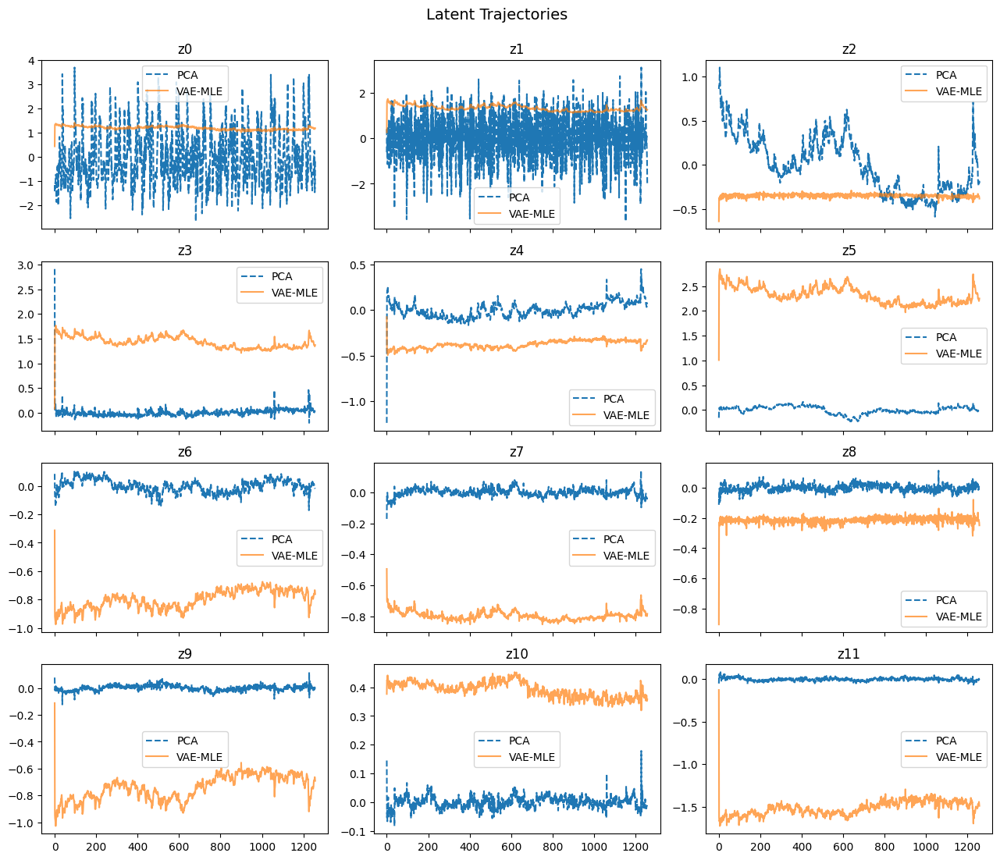

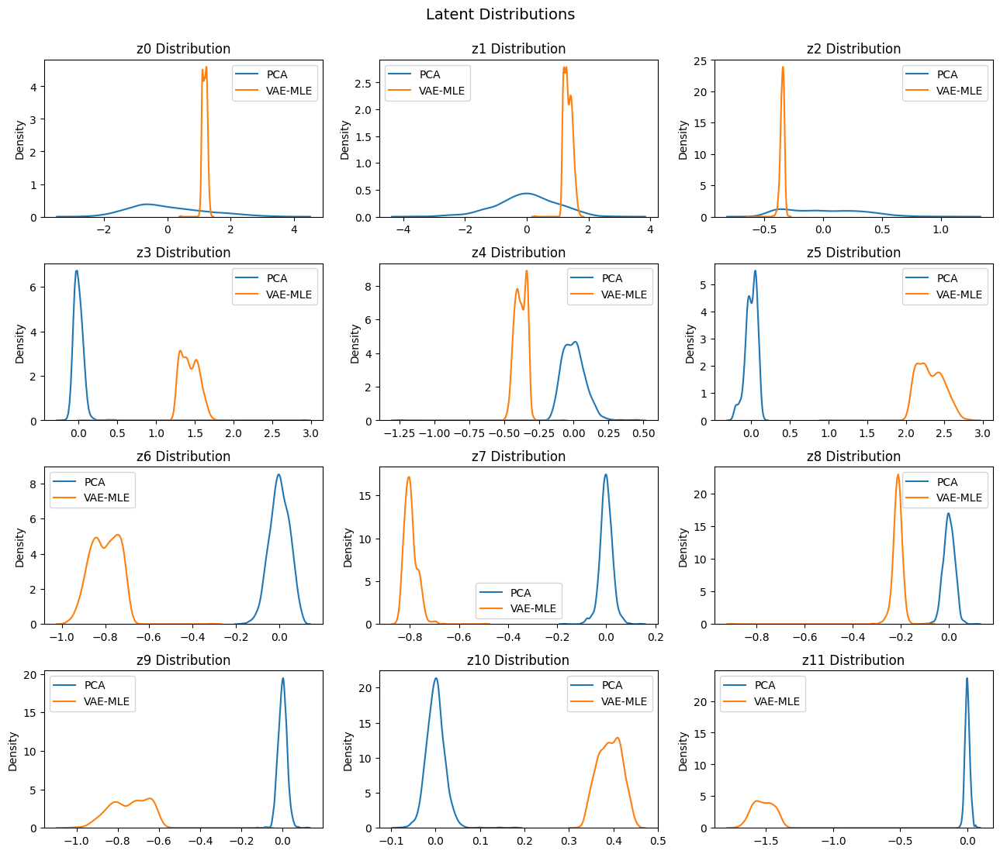

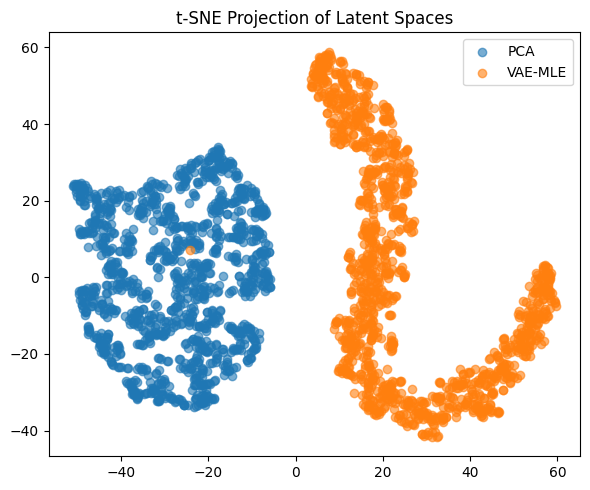


 Reconstruction RMSE Comparison:
• PCA           RMSE: 0.003108
• AE            RMSE: 0.015214
• VAE-L1        RMSE: 0.051787
• VAE-L2        RMSE: 0.070951
• VAE-L2 (batch)RMSE: 0.099443
• VAE-MLE       RMSE: 0.020489


In [35]:
import importlib
import utils.eval
importlib.reload(utils.eval)
from utils.eval import compare_latent_spaces


print("\n PCA vs VAE-MLE — Trajectories and t-SNE")
compare_latent_spaces(
    Z_a=Z_pca,
    Z_b=Z_vae_mle,
    valid_mask=valid_mask,
    labels=("PCA", "VAE-MLE"),
    method="trajectory",
    full_analysis=True
)

compare_latent_spaces(
    Z_a=Z_pca,
    Z_b=Z_vae_mle,
    valid_mask=valid_mask,
    labels=("PCA", "VAE-MLE"),
    method="tsne"
)


print("\n Reconstruction RMSE Comparison:")
print(f"• PCA           RMSE: {rmse_pca:.6f}")
print(f"• AE            RMSE: {rmse_ae:.6f}")
print(f"• VAE-L1        RMSE: {rmse_vae_l1:.6f}")
print(f"• VAE-L2        RMSE: {rmse_vae_l2:.6f}")
print(f"• VAE-L2 (batch)RMSE: {rmse_vae_l2_batch:.6f}")
print(f"• VAE-MLE       RMSE: {rmse_vae_mle:.6f}")


Surface reconstruction RMSE: 0.0037


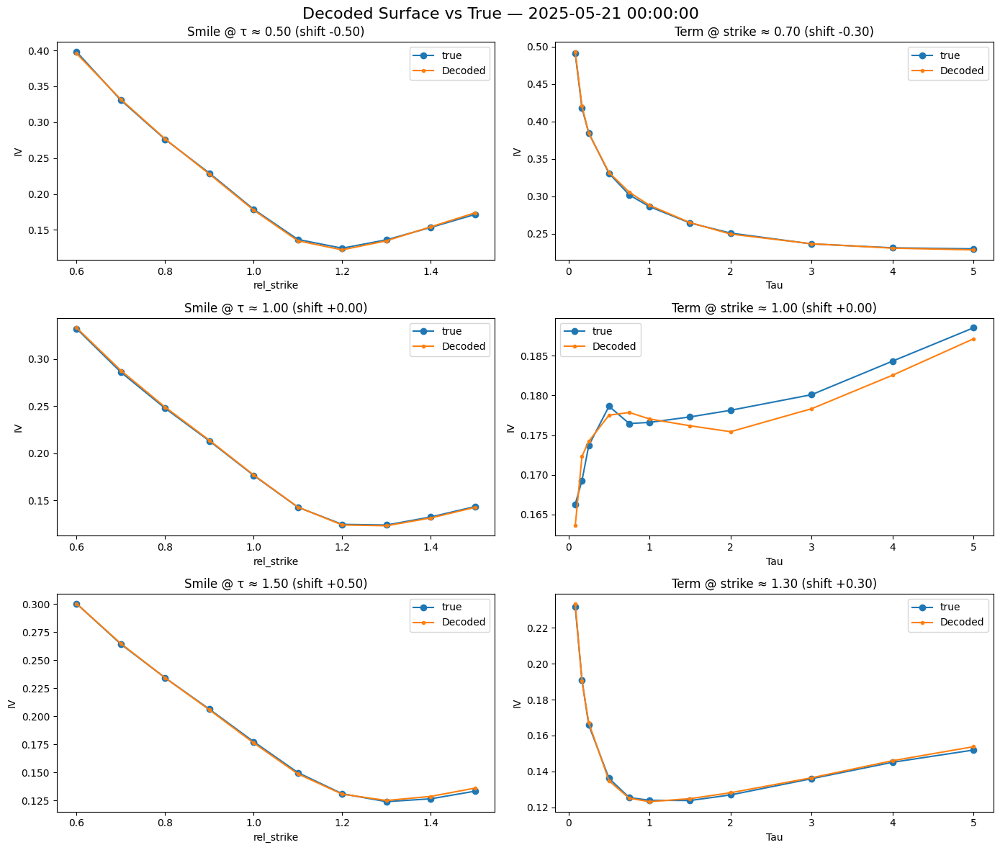

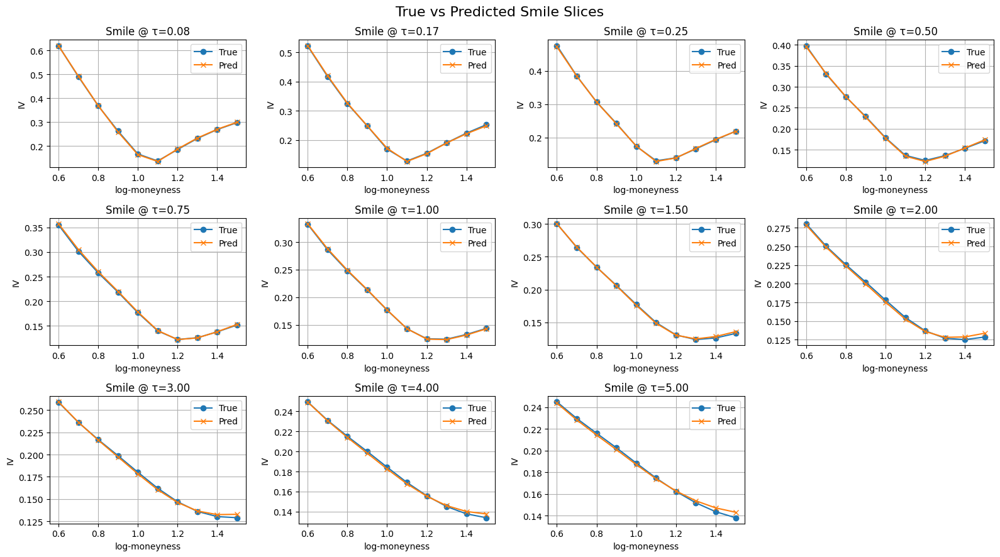


pca vs fwpca - trajectories and t-sne


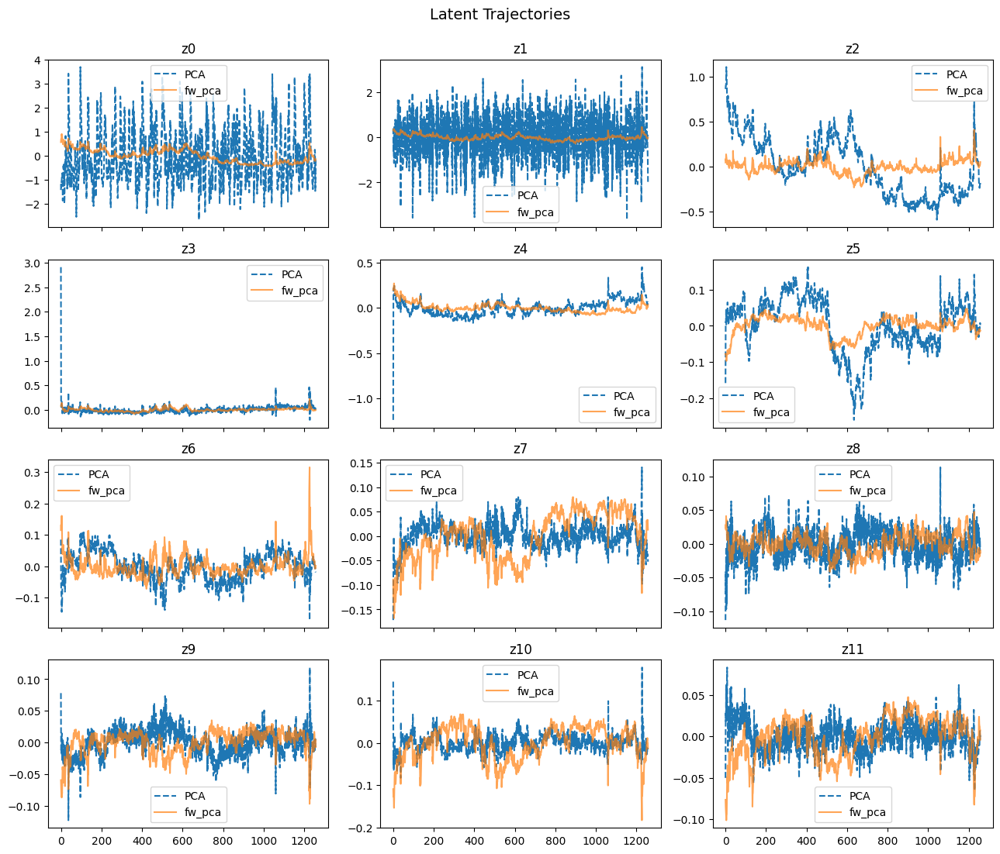

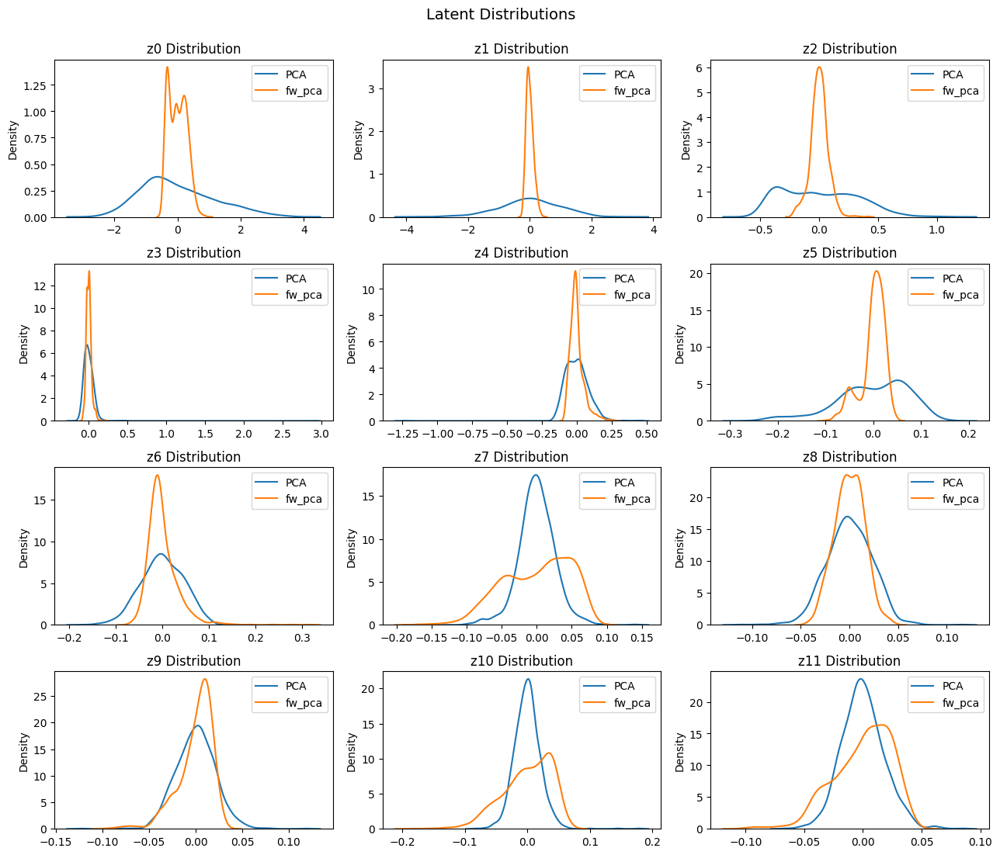

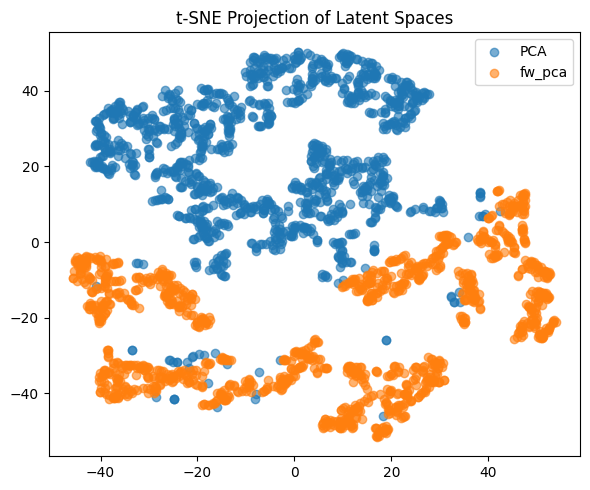


reconstruction rmse comparison:
• pca           rmse: 0.003108
• ae            rmse: 0.015214
• vae-l1        rmse: 0.051787
• vae-l2        rmse: 0.070951
• vae-l2 (batch)rmse: 0.099443
• vae-mle       rmse: 0.020489
• fwpca           rmse: 0.003723


In [ ]:
import importlib
import models.fw_pca
importlib.reload(models.fw_pca)

from models.fw_pca import FeatureWeightedPCA, FWPCAEncoderWrapper
from utils.eval import evaluate_encoder, compare_latent_spaces
from keras import ops

# extract surface tensor and flatten
surface_tensor = tensors["surface_tensor"]
X_surface_tensor = surface_tensor[..., -1].reshape(surface_tensor.shape[0], -1)

# fit fwpca
fwpca = FeatureWeightedPCA(n_components=LATENT_DIM)
fwpca.fit(X_surface_tensor, X_feat_tensor)

# encode and decode
Z_fwpca_tensor = fwpca.transform(X_surface_tensor)
X_recon_fwpca_tensor = fwpca.inverse_transform(Z_fwpca_tensor)

Z_fw_pca = ops.convert_to_numpy(Z_fwpca_tensor)
X_recon_fw_pca = ops.convert_to_numpy(X_recon_fwpca_tensor)

# wrap for evaluation
encoder_fw_pca = FWPCAEncoderWrapper(fwpca, X_feat_tensor, M, K)

rmse_fw_pca, X_recon_surf_fw_pca, X_true_surf_fw_pca = evaluate_encoder(
   encoder=encoder_fw_pca,
   X_surface=X_surface[:X_feat_tensor.shape[0]],    # align with fwpca input
   X_features=X_features[:X_feat_tensor.shape[0]],  # truncate
   M=M, K=K
)

# plot example surface
plot_iv_slices_shifts(
   true_surface=X_true_surf_fw_pca[-1],
   decoded_surface=X_recon_surf_fw_pca[-1],
   taus=tensors["taus"],
   rel_strikes=tensors["rel_strikes"],
   decoded_date=tensors["date_tensor"][-1],
   target_tau=TARGET_TAU,
   target_strike=TARGET_STRIKE
)

plot_smile_slices_comparison(
   true_surface=X_true_surf_fw_pca[-1],
   pred_surface=X_recon_surf_fw_pca[-1],
   rel_strikes=tensors["rel_strikes"],
   taus=tensors["taus"]
)

# pca vs fwpca
print("\npca vs fwpca - trajectories and t-sne")
compare_latent_spaces(
   Z_a=Z_pca,
   Z_b=Z_fw_pca,
   valid_mask=valid_mask,
   labels=("PCA", "FW-PCA"),
   method="trajectory",
   full_analysis=True
)

compare_latent_spaces(
   Z_a=Z_pca,
   Z_b=Z_fw_pca,
   valid_mask=valid_mask,
   labels=("PCA", "FW-PCA"),
   method="tsne"
)

# final rmse printout
print("\nreconstruction rmse comparison:")
print(f"• pca           rmse: {rmse_pca:.6f}")
print(f"• ae            rmse: {rmse_ae:.6f}")
print(f"• vae-l1        rmse: {rmse_vae_l1:.6f}")
print(f"• vae-l2        rmse: {rmse_vae_l2:.6f}")
print(f"• vae-l2 (batch)rmse: {rmse_vae_l2_batch:.6f}")
print(f"• vae-mle       rmse: {rmse_vae_mle:.6f}")
print(f"• fwpca           rmse: {rmse_fw_pca:.6f}")

In [37]:
import importlib
import models.vae_mle_fv
importlib.reload(models.vae_mle_fv)

from keras.optimizers import Adam
from keras.callbacks import ModelCheckpoint, ReduceLROnPlateau, EarlyStopping
from models.vae_mle_fv import VAE, build_encoder, build_decoder_diag_d, VAETrainingDebugCallback, KLEpochTracker
import os

# output directory
os.makedirs("saved_models/vae_mle_fv", exist_ok=True)

# config
optimizer_mle_fv = Adam(1e-5)
vae_beta_fv = 0.3
vae_latent_dim = LATENT_DIM

# inputs from dataset
X_train_fv = train_dataset.to_tensor()
X_val_fv   = val_dataset.to_tensor()

# build model
encoder_fv = build_encoder(input_dim=X_train_fv.shape[1], latent_dim=vae_latent_dim)
decoder_fv = build_decoder_diag_d(output_dim=X_train_fv.shape[1], latent_dim=vae_latent_dim)
vae_fv = VAE(encoder=encoder_fv, decoder=decoder_fv, beta=vae_beta_fv, kl_warmup=True)
vae_fv.compile(optimizer=optimizer_mle_fv)

# callbacks
callbacks_fv = [
   KLEpochTracker(vae_fv),
   VAETrainingDebugCallback(vae_model=vae_fv, X_val=X_val_fv, name="vae_mle_fv_debug"),
   ModelCheckpoint("saved_models/vae_mle_fv/vae_mle_fv.weights.h5", monitor="val_loss", save_best_only=True, save_weights_only=True),
   ReduceLROnPlateau(monitor="val_loss", factor=0.5, patience=5),
   EarlyStopping(monitor="val_loss", patience=10, restore_best_weights=False)
]

# train
history_vae_fv = vae_fv.fit(
   X_train_fv, X_train_fv,
   validation_data=(X_val_fv, X_val_fv),
   epochs=150,
   batch_size=32,
   callbacks=callbacks_fv,
   verbose=1
)

# save
vae_fv.save("saved_models/vae_mle_fv/vae_mle_fv_model.keras")
vae_fv.encoder.save("saved_models/vae_mle_fv/vae_mle_fv_encoder.keras")
vae_fv.decoder.save("saved_models/vae_mle_fv/vae_mle_fv_decoder.keras")

Epoch 1/150
25/28 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - kl_loss: 0.0410 - loss: 0.0862 - reconstruction_loss: 0.0862 - z_logvar_mean: -0.0138 - z_std: 0.2125[vae_mle_fv_debug | epoch 001] recon l1: 0.195961 | z_std: 0.2013 | z_mean_abs: 0.1711 | z_logvar_mean: -0.1096
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - kl_loss: 0.0409 - loss: 0.0858 - reconstruction_loss: 0.0858 - z_logvar_mean: -0.0188 - z_std: 0.2120 - val_kl_loss: 0.0372 - val_loss: 0.0676 - val_reconstruction_loss: 0.0676 - val_val_z_logvar_mean: -0.1098 - val_val_z_std: 0.2010 - val_z_logvar_mean: -0.1098 - val_z_std: 0.2010 - learning_rate: 1.0000e-05
Epoch 2/150
25/28 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - kl_loss: 0.0477 - loss: 0.0737 - reconstruction_loss: 0.0734 - z_logvar_mean: -0.1545 - z_std: 0.2218[vae_mle_fv_debug | epoch 002] recon l1: 0.179315 | z_std: 0.2356 | z_mean_abs: 0.2181 | z_logvar_mean: -0.2146
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - kl_loss: 0.0485 - loss: 0.0734 - reconstruction_loss: 0.0731 - z_logvar

### latent variance collapsed again 

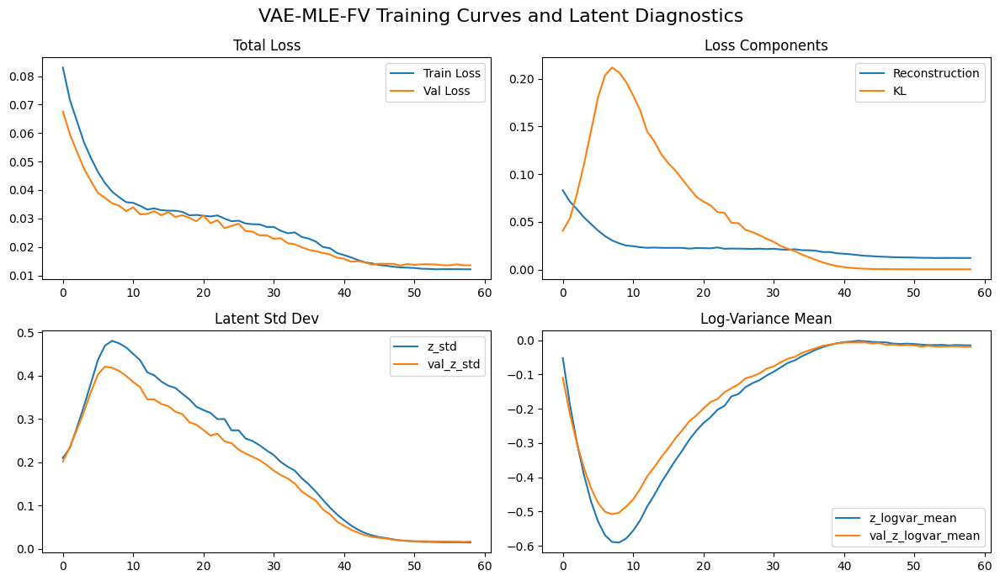

In [38]:
import matplotlib.pyplot as plt

fig, axs = plt.subplots(2, 2, figsize=(12, 7))
plt.suptitle("VAE-MLE-FV Training Curves and Latent Diagnostics", fontsize=16)

axs[0, 0].plot(history_vae_fv.history["loss"], label="Train Loss")
axs[0, 0].plot(history_vae_fv.history.get("val_loss", []), label="Val Loss")
axs[0, 0].set_title("Total Loss")
axs[0, 0].legend()

axs[0, 1].plot(history_vae_fv.history.get("reconstruction_loss", []), label="Reconstruction")
axs[0, 1].plot(history_vae_fv.history.get("kl_loss", []), label="KL")
axs[0, 1].set_title("Loss Components")
axs[0, 1].legend()

axs[1, 0].plot(history_vae_fv.history.get("z_std", []), label="z_std")
axs[1, 0].plot(history_vae_fv.history.get("val_z_std", []), label="val_z_std")
axs[1, 0].set_title("Latent Std Dev")
axs[1, 0].legend()

axs[1, 1].plot(history_vae_fv.history.get("z_logvar_mean", []), label="z_logvar_mean")
axs[1, 1].plot(history_vae_fv.history.get("val_z_logvar_mean", []), label="val_z_logvar_mean")
axs[1, 1].set_title("Log-Variance Mean")
axs[1, 1].legend()

plt.tight_layout()
plt.show()


In [39]:
from utils.eval import evaluate_forecast, print_evaluation
from keras import ops

# inputs from dataset
X_test_fv = test_dataset.to_tensor()

# evaluate model metrics
test_metrics_fv = vae_fv.evaluate(X_test_fv, X_test_fv, verbose=0)
recon_loss_fv, kl_div_fv, z_std_fv, *_ = [float(x) for x in test_metrics_fv]

print(f"\ntest loss breakdown (vae-mle-fv):")
print(f"• reconstruction ≈ {recon_loss_fv:.6f} | kl ≈ {kl_div_fv:.6f} | z_std ≈ {z_std_fv:.6f}")
print(" surface reconstructions are accurate." if recon_loss_fv < 1e-3 else " reconstruction error higher than expected.")
print(" kl term is small - posterior close to prior." if kl_div_fv < 1e-2 else " kl term is high - might overpower reconstruction.")
print(" latent space compressed but active." if 1e-3 < z_std_fv < 0.05 else " latent space underutilized or too dispersed.")

# decoding metrics
X_decoded_fv = vae_fv.predict(X_test_fv, verbose=0)
X_true_np = ops.convert_to_numpy(X_test_fv)

mse_fv, mae_fv, _, _ = evaluate_forecast(X_true_np, X_decoded_fv)
print_evaluation(mse_fv, mae_fv, label="vae-mle-fv surface (pointwise)")


test loss breakdown (vae-mle-fv):
• reconstruction ≈ 0.013103 | kl ≈ 0.013002 | z_std ≈ 0.000336
 reconstruction error higher than expected.
 kl term is high - might overpower reconstruction.
 latent space underutilized or too dispersed.
vae-mle-fv surface (pointwise) MSE: 0.012851 | MAE: 0.047207


11/40 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - kl_loss: 0.0179 - loss: 0.0119 - reconstruction_loss: 0.0119 - z_logvar_mean: -0.1089 - z_std: 0.1109   

c:\Users\alessandro.esposito\source\repos\imperial\.venv\lib\site-packages\keras\src\saving\saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 46 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - kl_loss: 0.1051 - loss: 0.0113 - reconstruction_loss: 0.0113 - z_logvar_mean: -0.3490 - z_std: 0.2774
Surface reconstruction RMSE: 0.0491


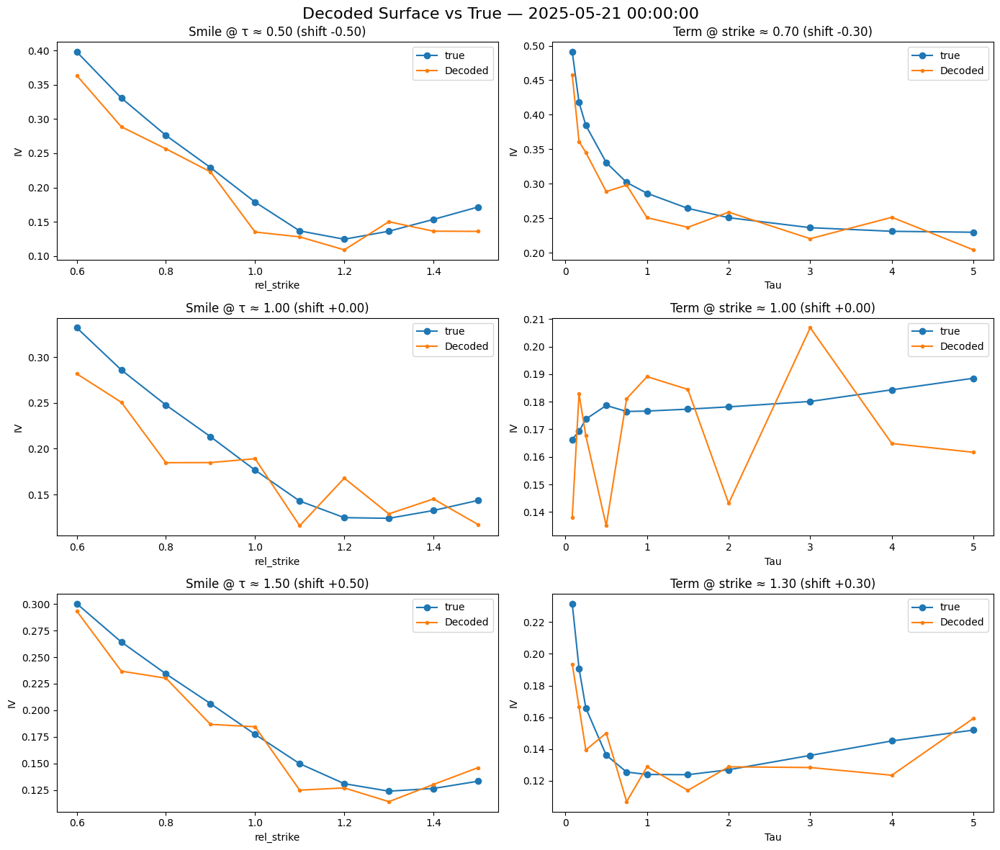

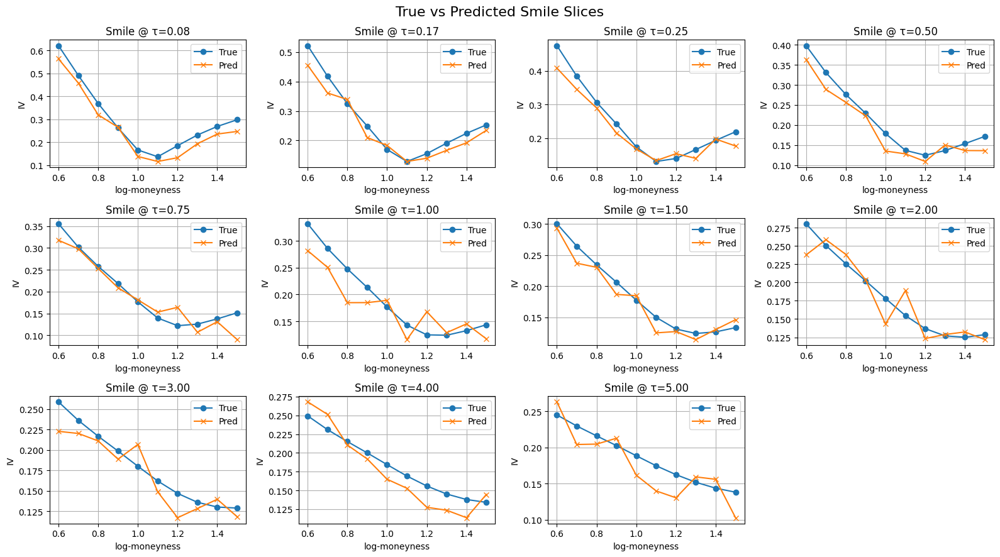

In [40]:
from models.vae_mle_fv import VAE, build_encoder, build_decoder_diag_d
from keras.optimizers import Adam
from keras import ops
import pandas as pd
from data.dataset import FeatureToSurfaceDataset

# load full combined dataset
X_full_tensor = FeatureToSurfaceDataset(
   surface_tensor=tensors["surface_tensor"],
   feature_tensor=X_feat_tensor,
   date_tensor=tensors["date_tensor"],
   batch_size=None
).to_tensor()

input_dim_fv = X_full_tensor.shape[1]

# rebuild model and load weights
encoder_fv = build_encoder(input_dim=input_dim_fv, latent_dim=vae_latent_dim)
decoder_fv = build_decoder_diag_d(output_dim=input_dim_fv, latent_dim=vae_latent_dim)

vae_fv = VAE(encoder=encoder_fv, decoder=decoder_fv, beta=vae_beta_fv, kl_warmup=True)
vae_fv.compile(optimizer=Adam(1e-4))
vae_fv(X_full_tensor[:1])  # build model
vae_fv.load_weights("saved_models/vae_mle_fv/vae_mle_fv.weights.h5")

# encode dataset
_, z_mean_fv, _ = vae_fv.encoder(X_full_tensor)
Z_vae_fv = ops.convert_to_numpy(z_mean_fv)

# evaluate surface rmse across full dataset
flat_len = M * K
X_surface = ops.convert_to_numpy(X_full_tensor[:, :flat_len])
X_features = ops.convert_to_numpy(X_full_tensor[:, flat_len:])

rmse_vae_fv, X_recon_surf_vae_fv, X_true_surf_vae_fv = evaluate_encoder(
   encoder=vae_fv,
   X_surface=X_surface,
   X_features=X_features,
   M=M, K=K
)

# select target date
TARGET_DATE = pd.Timestamp("2025-05-21")
target_idx = np.where(tensors["date_tensor"] == TARGET_DATE)[0][0]
surface_idx = target_idx

# visualize decoded vs true surface
plot_iv_slices_shifts(
   true_surface=X_true_surf_vae_fv[surface_idx],
   decoded_surface=X_recon_surf_vae_fv[surface_idx],
   taus=tensors["taus"],
   rel_strikes=tensors["rel_strikes"],
   decoded_date=TARGET_DATE,
   target_tau=TARGET_TAU,
   target_strike=TARGET_STRIKE
)

plot_smile_slices_comparison(
   true_surface=X_true_surf_vae_fv[surface_idx],
   pred_surface=X_recon_surf_vae_fv[surface_idx],
   rel_strikes=tensors["rel_strikes"],
   taus=tensors["taus"]
)


PCA vs VAE-MLE-FV — Trajectories and t-SNE


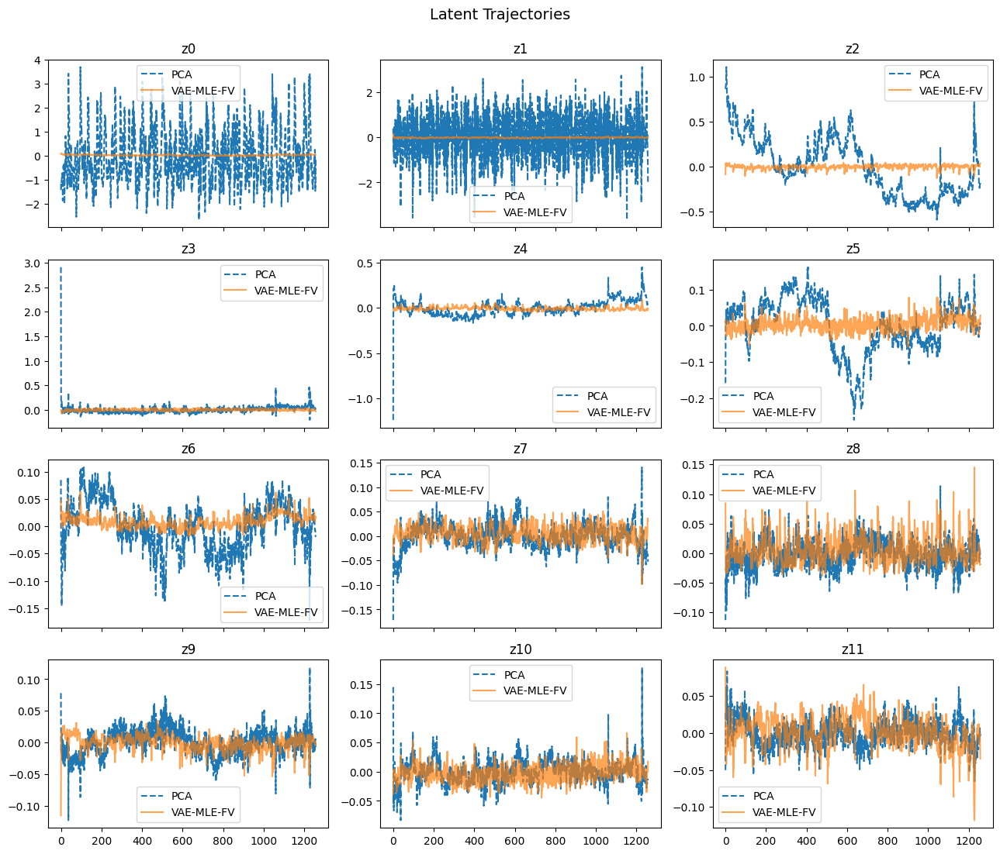

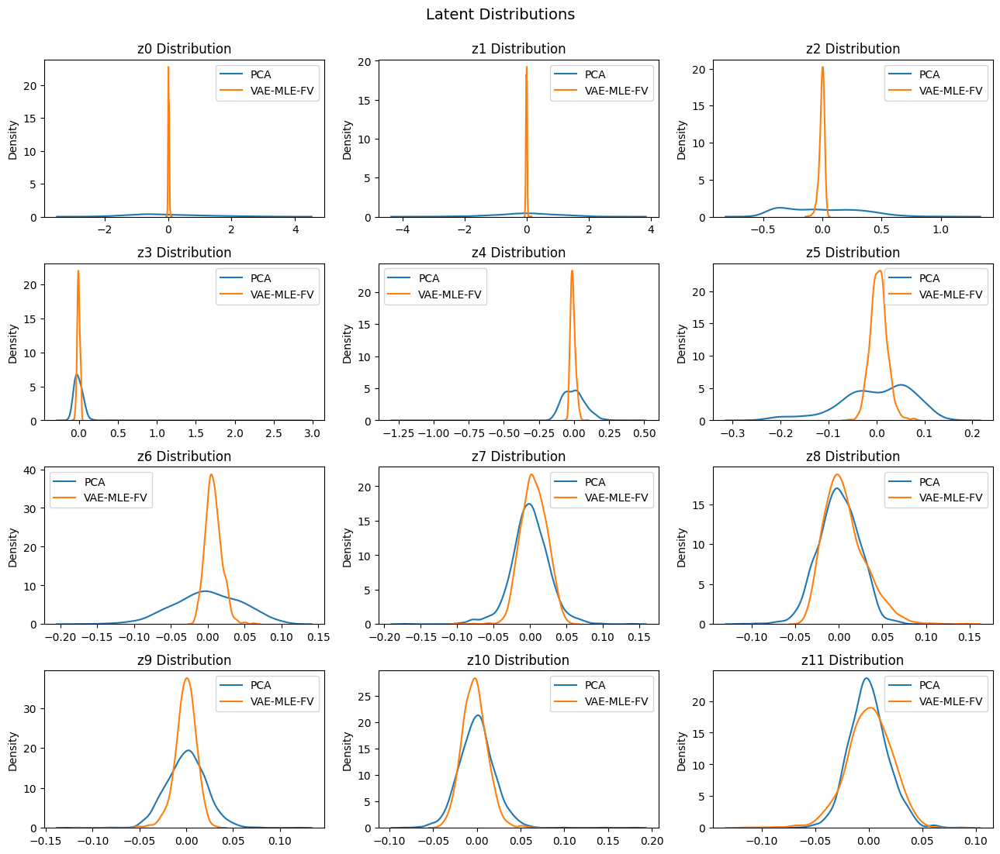

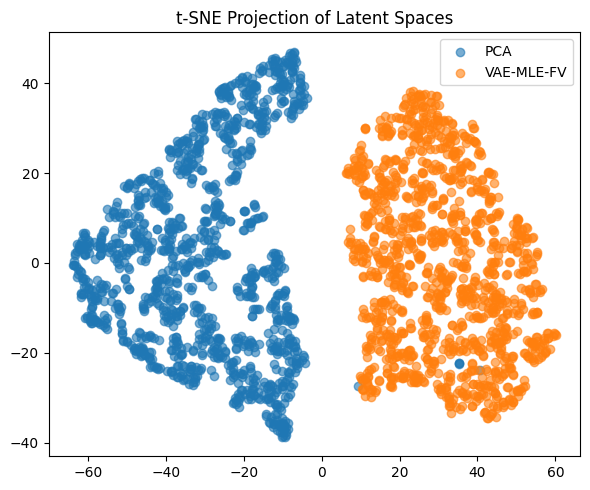


Reconstruction RMSE Comparison:
• PCA            RMSE: 0.003108
• AE             RMSE: 0.015214
• VAE-L1         RMSE: 0.051787
• VAE-L2         RMSE: 0.070951
• VAE-L2 (batch) RMSE: 0.099443
• VAE-MLE        RMSE: 0.020489
• VAE-MLE-FV     RMSE: 0.049063
• fw_pca            RMSE: 0.003723


In [41]:
import importlib
import utils.eval
importlib.reload(utils.eval)
from utils.eval import compare_latent_spaces



#  PCA vs VAE-MLE-FV
print("\nPCA vs VAE-MLE-FV — Trajectories and t-SNE")
compare_latent_spaces(
    Z_a=Z_pca,
    Z_b=Z_vae_fv,
    valid_mask=None,
    labels=("PCA", "VAE-MLE-FV"),
    method="trajectory",
    full_analysis=True
)

compare_latent_spaces(
    Z_a=Z_pca,
    Z_b=Z_vae_fv,
    valid_mask=None,
    labels=("PCA", "VAE-MLE-FV"),
    method="tsne"
)


print("\nReconstruction RMSE Comparison:")
print(f"• PCA            RMSE: {rmse_pca:.6f}")
print(f"• AE             RMSE: {rmse_ae:.6f}")
print(f"• VAE-L1         RMSE: {rmse_vae_l1:.6f}")
print(f"• VAE-L2         RMSE: {rmse_vae_l2:.6f}")
print(f"• VAE-L2 (batch) RMSE: {rmse_vae_l2_batch:.6f}")
print(f"• VAE-MLE        RMSE: {rmse_vae_mle:.6f}")
print(f"• VAE-MLE-FV     RMSE: {rmse_vae_fv:.6f}")
print(f"• fw_pca            RMSE: {rmse_fw_pca:.6f}")


In [42]:
import importlib
import models.vae_mle_b
importlib.reload(models.vae_mle_b)

from models.vae_mle_b import VAE, build_encoder, build_decoder, VAETrainingDebugCallback
from keras.optimizers import Adam
from keras.callbacks import ModelCheckpoint, ReduceLROnPlateau, EarlyStopping
import keras
import os

# output directory
os.makedirs("saved_models/vae_mle_b", exist_ok=True)

# config
optimizer_mle_b = Adam(5e-6)
vae_beta_mle_b = 0.2
vae_latent_dim = LATENT_DIM
EPOCHS = 300

# tensors
X_train_b = train_dataset.to_tensor()
X_val_b = val_dataset.to_tensor()
input_dim = X_train_b.shape[1]

# model
encoder_b = build_encoder(input_dim=input_dim, latent_dim=vae_latent_dim)
decoder_b = build_decoder(output_dim=input_dim, latent_dim=vae_latent_dim)
vae_mle_b = VAE(encoder=encoder_b, decoder=decoder_b, beta=vae_beta_mle_b, kl_warmup=True)
vae_mle_b.compile(
   optimizer=optimizer_mle_b,
   metrics=[keras.metrics.Mean()]  # dummy just to enable compiled_metrics
)

vae_mle_b(X_train_b[:1])  # build model

callbacks_mle_b = [
   VAETrainingDebugCallback(vae_model=vae_mle_b, X_val=X_val_b, name="vae_mle_b_debug"),
   ModelCheckpoint("saved_models/vae_mle_b/vae_mle_b.weights.h5", monitor="val_loss", save_best_only=True, save_weights_only=True),
   ReduceLROnPlateau(monitor="val_loss", factor=0.5, patience=5),
   EarlyStopping(monitor="val_loss", patience=10, restore_best_weights=False)
]

history_vae_mle_b = vae_mle_b.fit_batches(
   dataset=train_dataset,
   val_dataset=val_dataset,
   epochs=EPOCHS,
   verbose=True,
   callbacks=callbacks_mle_b
)

# save
vae_mle_b.save("saved_models/vae_mle_b/vae_mle_b_model.keras")
vae_mle_b.encoder.save("saved_models/vae_mle_b/vae_mle_b_encoder.keras")
vae_mle_b.decoder.save("saved_models/vae_mle_b/vae_mle_b_decoder.keras")


epoch 1/300
{'loss': -0.24341, 'reconstruction_loss': -0.24341, 'kl_loss': 0.04651, 'z_std': 0.24362, 'z_logvar_mean': -0.12003, 'val_loss': -0.26093, 'val_reconstruction_loss': -0.26093, 'val_kl_loss': 0.04495, 'val_z_std': 0.24914, 'val_z_logvar_mean': -0.12027}
[vae_mle_b_debug | epoch 001] recon mle: 0.208186 | z_std: 0.2362 | z_mean_abs: 0.1826 | z_logvar_mean: -0.1240

epoch 2/300
{'loss': -0.25449, 'reconstruction_loss': -0.25467, 'kl_loss': 0.05321, 'z_std': 0.25919, 'z_logvar_mean': -0.17734, 'val_loss': -0.27305, 'val_reconstruction_loss': -0.27323, 'val_kl_loss': 0.05191, 'val_z_std': 0.26566, 'val_z_logvar_mean': -0.16883}
[vae_mle_b_debug | epoch 002] recon mle: 0.203164 | z_std: 0.2512 | z_mean_abs: 0.1918 | z_logvar_mean: -0.1728

epoch 3/300
{'loss': -0.2665, 'reconstruction_loss': -0.26695, 'kl_loss': 0.06754, 'z_std': 0.29363, 'z_logvar_mean': -0.23231, 'val_loss': -0.29205, 'val_reconstruction_loss': -0.29248, 'val_kl_loss': 0.06424, 'val_z_std': 0.29528, 'val_z_log

### this optimizes per batch, not per epoch. Each batch gets its own gradient  update, which can lead to more frequent but noisier updates compared to  full-batch training. This is standard SGD behavior - the loss is computed  and backpropagated for each batch independently. variance does not collpase but we need to check if it perfroms better on reconstruction 

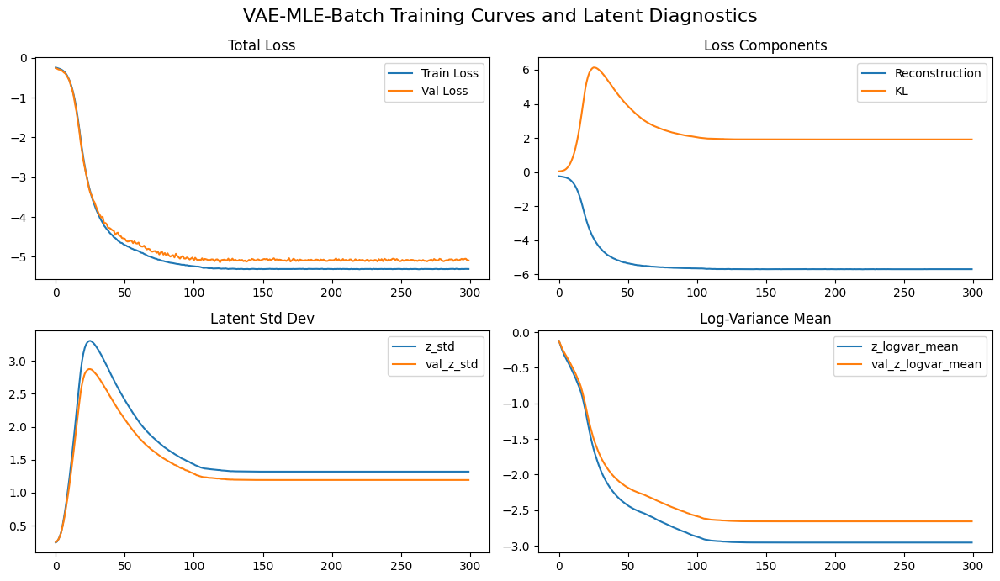

In [43]:
import matplotlib.pyplot as plt

fig, axs = plt.subplots(2, 2, figsize=(12, 7))
plt.suptitle("VAE-MLE-Batch Training Curves and Latent Diagnostics", fontsize=16)

axs[0, 0].plot(history_vae_mle_b["loss"], label="Train Loss")
axs[0, 0].plot(history_vae_mle_b.get("val_loss", []), label="Val Loss")
axs[0, 0].set_title("Total Loss")
axs[0, 0].legend()

axs[0, 1].plot(history_vae_mle_b.get("reconstruction_loss", []), label="Reconstruction")
axs[0, 1].plot(history_vae_mle_b.get("kl_loss", []), label="KL")
axs[0, 1].set_title("Loss Components")
axs[0, 1].legend()

axs[1, 0].plot(history_vae_mle_b.get("z_std", []), label="z_std")
axs[1, 0].plot(history_vae_mle_b.get("val_z_std", []), label="val_z_std")
axs[1, 0].set_title("Latent Std Dev")
axs[1, 0].legend()

axs[1, 1].plot(history_vae_mle_b.get("z_logvar_mean", []), label="z_logvar_mean")
axs[1, 1].plot(history_vae_mle_b.get("val_z_logvar_mean", []), label="val_z_logvar_mean")
axs[1, 1].set_title("Log-Variance Mean")
axs[1, 1].legend()

plt.tight_layout()
plt.show()


In [44]:
from utils.eval import evaluate_forecast, print_evaluation
from keras import ops


X_test_b = test_dataset.to_tensor()


test_logs_b = vae_mle_b.test_step((X_test_b, X_test_b))
recon_loss_b = float(test_logs_b["reconstruction_loss"])
kl_div_b = float(test_logs_b["kl_loss"])
z_std_b = float(test_logs_b["z_std"])

print(f"\nTest loss breakdown (VAE-MLE-B):")
print(f"• Reconstruction ≈ {recon_loss_b:.6f} | KL ≈ {kl_div_b:.6f} | z_std ≈ {z_std_b:.6f}")
print(" Surface reconstructions are accurate." if recon_loss_b < 1e-3 else " Reconstruction error higher than expected.")
print(" KL term is small — posterior close to prior." if kl_div_b < 1e-2 else " KL term is high — might overpower reconstruction.")
print(" Latent space compressed but active." if 1e-3 < z_std_b < 0.05 else " Latent space underutilized or too dispersed.")


X_decoded_b = vae_mle_b.predict(X_test_b, verbose=0)
X_true_np = ops.convert_to_numpy(X_test_b)

mse_b, mae_b, _, _ = evaluate_forecast(X_true_np, X_decoded_b)
print_evaluation(mse_b, mae_b, label="VAE-MLE-B surface (pointwise)")



Test loss breakdown (VAE-MLE-B):
• Reconstruction ≈ -5.532117 | KL ≈ 1.712794 | z_std ≈ 1.237877
 Surface reconstructions are accurate.
 KL term is high — might overpower reconstruction.
 Latent space underutilized or too dispersed.
VAE-MLE-B surface (pointwise) MSE: 0.010731 | MAE: 0.030498


 6/40 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - kl_loss: 1.8504 - loss: -5.5968 - reconstruction_loss: -5.5968 - z_logvar_mean: -2.8592 - z_std: 1.3065

c:\Users\alessandro.esposito\source\repos\imperial\.venv\lib\site-packages\keras\src\saving\saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 50 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


40/40 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - kl_loss: 1.9225 - loss: -5.6372 - reconstruction_loss: -5.6372 - z_logvar_mean: -2.9013 - z_std: 1.3436
Surface reconstruction RMSE: 0.0259


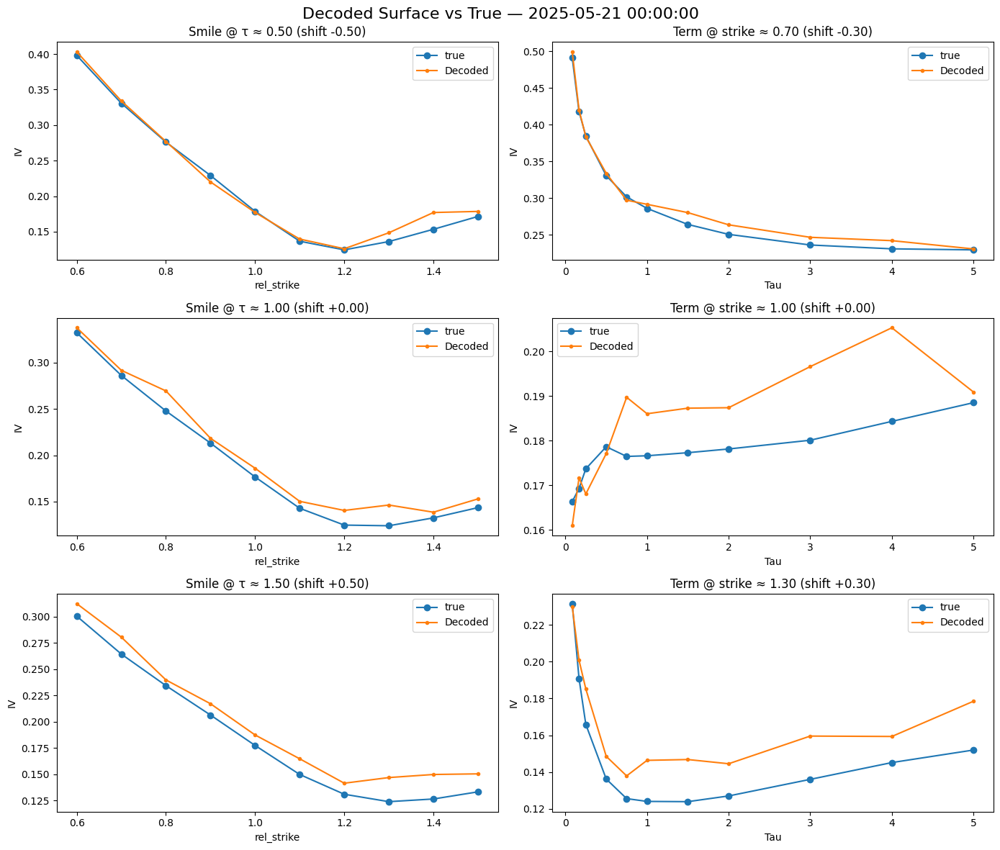

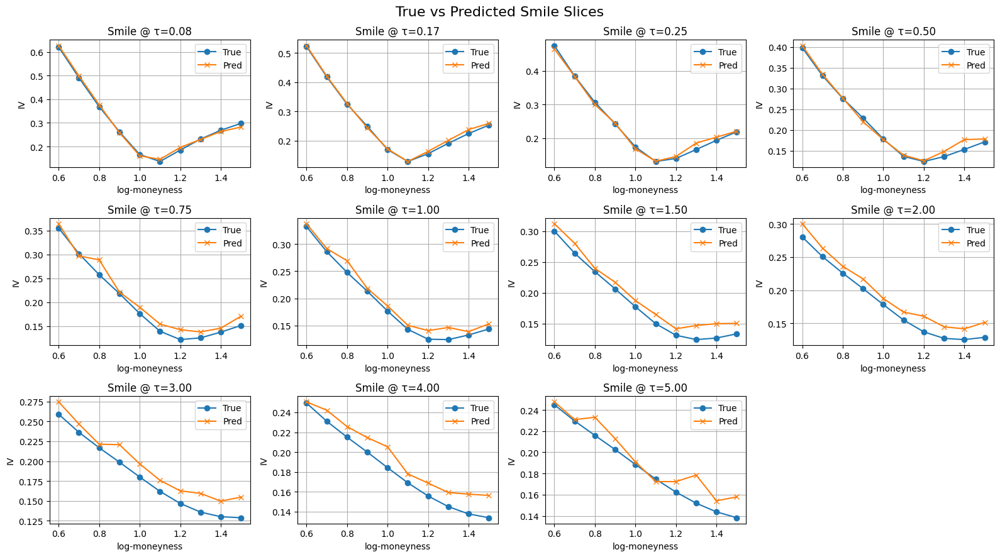

In [45]:
from models.vae_mle_b import VAE, build_encoder, build_decoder
from keras.optimizers import Adam
from keras import ops
import pandas as pd
from data.dataset import FeatureToSurfaceDataset

# build full dataset
X_full_tensor_b = FeatureToSurfaceDataset(
   surface_tensor=tensors["surface_tensor"],
   feature_tensor=X_feat_tensor,
   date_tensor=tensors["date_tensor"],
   batch_size=None
).to_tensor()

input_dim_b = X_full_tensor_b.shape[1]

# rebuild and load model
encoder_b = build_encoder(input_dim=input_dim_b, latent_dim=vae_latent_dim)
decoder_b = build_decoder(output_dim=input_dim_b, latent_dim=vae_latent_dim)

vae_mle_b = VAE(encoder=encoder_b, decoder=decoder_b, beta=vae_beta_mle_b, kl_warmup=True)
vae_mle_b.compile(optimizer=Adam(5e-6))
vae_mle_b(X_full_tensor_b[:1])  # build
vae_mle_b.load_weights("saved_models/vae_mle_b/vae_mle_b.weights.h5")

# encode
_, z_mean_b, _ = vae_mle_b.encoder(X_full_tensor_b)
Z_vae_mle_b = ops.convert_to_numpy(z_mean_b)

# evaluate surface rmse across full dataset
flat_len = M * K
X_surface = ops.convert_to_numpy(X_full_tensor_b[:, :flat_len])
X_features = ops.convert_to_numpy(X_full_tensor_b[:, flat_len:])

rmse_vae_mle_b, X_recon_surf_vae_b, X_true_surf_vae_b = evaluate_encoder(
   encoder=vae_mle_b,
   X_surface=X_surface,
   X_features=X_features,
   M=M, K=K
)

# select target date
TARGET_DATE = pd.Timestamp("2025-05-21")
target_idx = np.where(tensors["date_tensor"] == TARGET_DATE)[0][0]
surface_idx = target_idx

# visualize decoded vs true surface
plot_iv_slices_shifts(
   true_surface=X_true_surf_vae_b[surface_idx],
   decoded_surface=X_recon_surf_vae_b[surface_idx],
   taus=tensors["taus"],
   rel_strikes=tensors["rel_strikes"],
   decoded_date=TARGET_DATE,
   target_tau=TARGET_TAU,
   target_strike=TARGET_STRIKE
)

plot_smile_slices_comparison(
   true_surface=X_true_surf_vae_b[surface_idx],
   pred_surface=X_recon_surf_vae_b[surface_idx],
   rel_strikes=tensors["rel_strikes"],
   taus=tensors["taus"]
)


PCA vs VAE-MLE-B — Trajectories and t-SNE


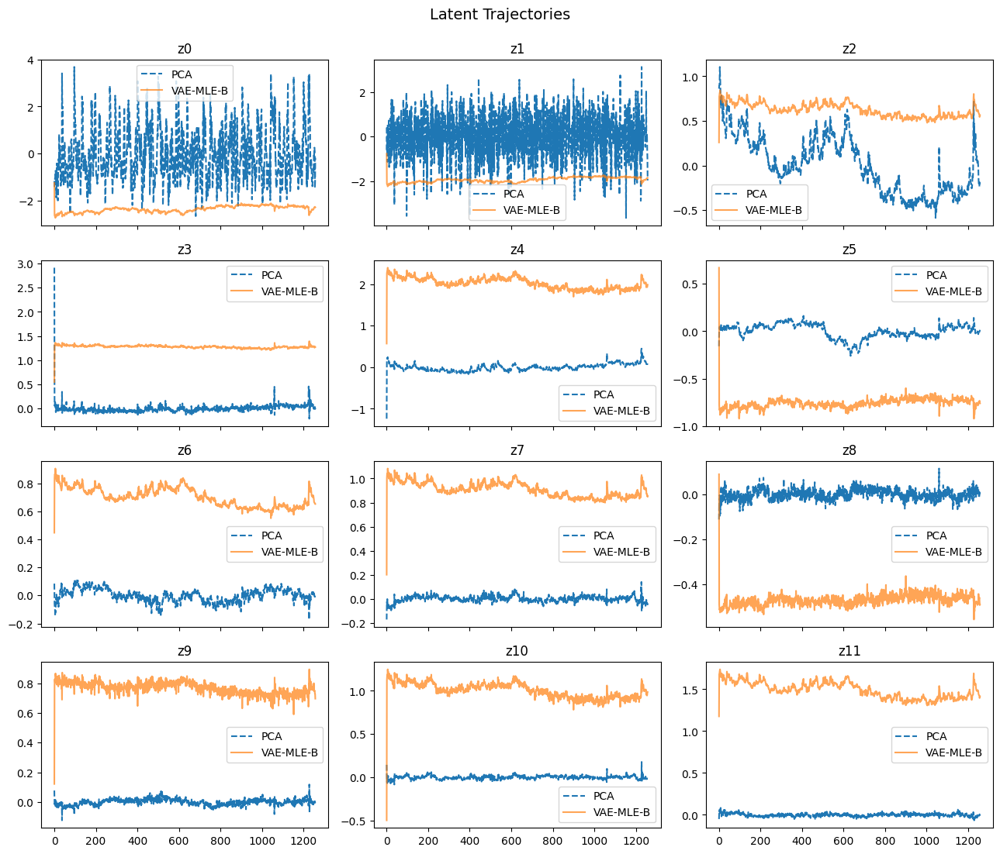

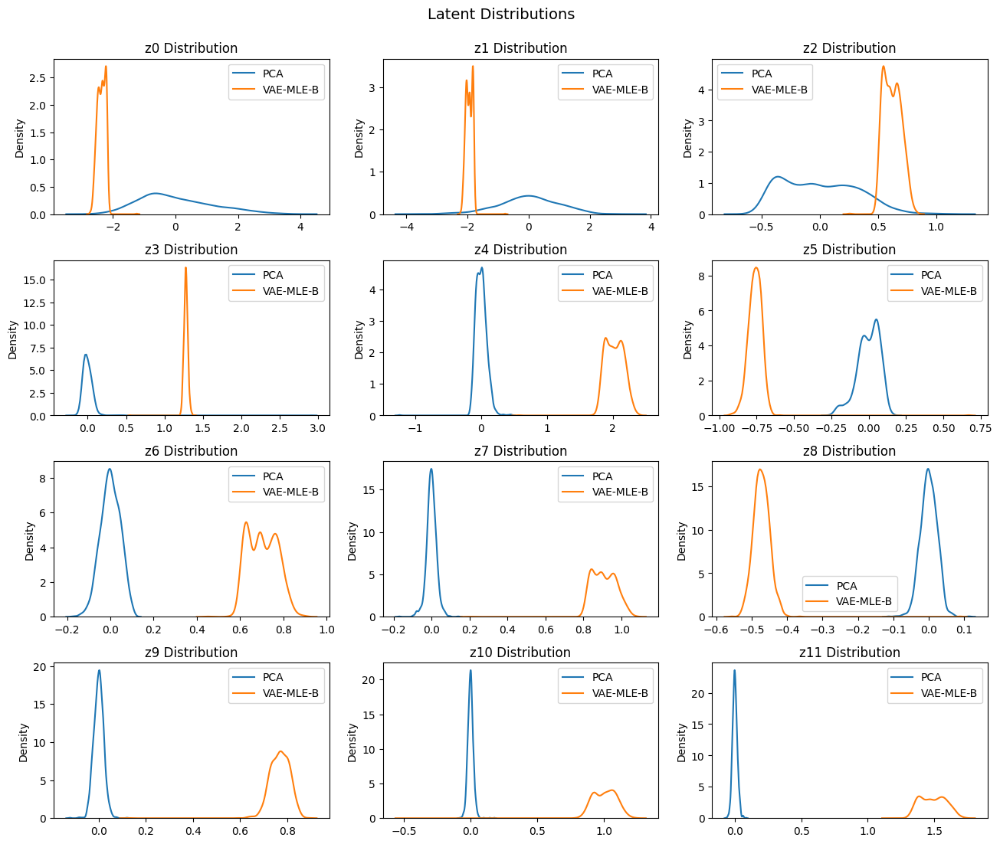

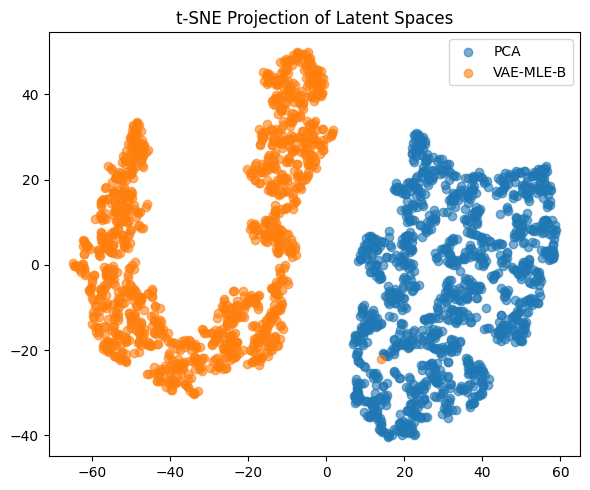


Reconstruction RMSE and MSE Comparison:
• PCA            RMSE: 0.003108 | MSE: 0.000010
• AE             RMSE: 0.015214 | MSE: 0.000231
• VAE-L1         RMSE: 0.051787 | MSE: 0.002682
• VAE-L2         RMSE: 0.070951 | MSE: 0.005034
• VAE-L2 (batch) RMSE: 0.099443 | MSE: 0.009889
• VAE-MLE        RMSE: 0.020489 | MSE: 0.000420
• VAE-MLE-B      RMSE: 0.025919 | MSE: 0.000672
• VAE-MLE-FV     RMSE: 0.049063 | MSE: 0.002407
• fw_pca            RMSE: 0.003723 | MSE: 0.000014


In [46]:
import importlib
import utils.eval
importlib.reload(utils.eval)
from utils.eval import compare_latent_spaces

# --- PCA vs VAE-MLE-B
print("\nPCA vs VAE-MLE-B — Trajectories and t-SNE")
compare_latent_spaces(
    Z_a=Z_pca,
    Z_b=Z_vae_mle_b,
    valid_mask=None,
    labels=("PCA", "VAE-MLE-B"),
    method="trajectory",
    full_analysis=True
)

compare_latent_spaces(
    Z_a=Z_pca,
    Z_b=Z_vae_mle_b,
    valid_mask=None,
    labels=("PCA", "VAE-MLE-B"),
    method="tsne"
)

print("\nReconstruction RMSE and MSE Comparison:")
print(f"• PCA            RMSE: {rmse_pca:.6f} | MSE: {rmse_pca**2:.6f}")
print(f"• AE             RMSE: {rmse_ae:.6f} | MSE: {rmse_ae**2:.6f}")
print(f"• VAE-L1         RMSE: {rmse_vae_l1:.6f} | MSE: {rmse_vae_l1**2:.6f}")
print(f"• VAE-L2         RMSE: {rmse_vae_l2:.6f} | MSE: {rmse_vae_l2**2:.6f}")
print(f"• VAE-L2 (batch) RMSE: {rmse_vae_l2_batch:.6f} | MSE: {rmse_vae_l2_batch**2:.6f}")
print(f"• VAE-MLE        RMSE: {rmse_vae_mle:.6f} | MSE: {rmse_vae_mle**2:.6f}")
print(f"• VAE-MLE-B      RMSE: {rmse_vae_mle_b:.6f} | MSE: {rmse_vae_mle_b**2:.6f}")
print(f"• VAE-MLE-FV     RMSE: {rmse_vae_fv:.6f} | MSE: {rmse_vae_fv**2:.6f}")
print(f"• fw_pca            RMSE: {rmse_fw_pca:.6f} | MSE: {rmse_fw_pca**2:.6f}")



VAE-MLE        RMSE: 0.019532 | MSE: 0.000382
• VAE-MLE-B      RMSE: 0.027133 | MSE: 0.000736 we progress MLE and discard batch optimization